# Rainfall Prediction - Weather Forecasting

Problem Statement:

- Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

# Problem Statement: 
- Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

- Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


# Dataset Description:


- Date  - The date of observation

- Location  -The common name of the location of the weather station

- MinTemp  -The minimum temperature in degrees celsius

- MaxTemp -The maximum temperature in degrees celsius

- Rainfall  -The amount of rainfall recorded for the day in mm

- Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

- Sunshine  -The number of hours of bright sunshine in the day.

- WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

- WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

- WindDir9am -Direction of the wind at 9am

- WindDir3pm -Direction of the wind at 3pm

- WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

- WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

- Humidity9am -Humidity (percent) at 9am

- Humidity3pm -Humidity (percent) at 3pm

- Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

- Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

- Cloud9am - Fraction of sky obscured by cloud at 9am. 

- Cloud3pm -Fraction of sky obscured by cloud 

- Temp9am-Temperature (degrees C) at 9am

- Temp3pm -Temperature (degrees C) at 3pm

- RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

- RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

In [1]:
# importing important library
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
df1=pd.read_csv("Rainfall_Predict.csv")

In [3]:
# Making a copy to df
df=pd.DataFrame(data=df1)

In [4]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
df.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [6]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,ESE,17.0,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [7]:
type(df)

pandas.core.frame.DataFrame

In [8]:
df.shape

(8425, 23)

In [9]:
df.ndim

2

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

# Observation Shows:

Columns are:
- 16 columns for float64 
- 07 columns for object

Memory usage:
- 1.5+ MB

# Null Values

In [11]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Text(0.5, 1.0, 'Heatmap Representing Null Values')

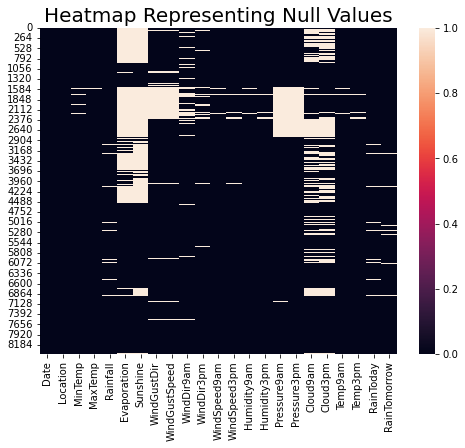

In [12]:
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.title("Heatmap Representing Null Values",fontsize=20)

# Checking Unique Values

### 1. Categorical Columns

In [13]:
for i in df.columns:
    if df[i].dtype=='object':
        print("Column ",i,"\n")
        print(df[i].unique())
        print("*****"*10)

Column  Date 

['2008-12-01' '2008-12-02' '2008-12-03' ... '2013-06-06' '2013-06-07'
 '2013-06-08']
**************************************************
Column  Location 

['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru']
**************************************************
Column  WindGustDir 

['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' nan 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'E' 'SSW']
**************************************************
Column  WindDir9am 

['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW' 'N' 'WSW' 'ESE' 'E'
 'NW' 'WNW' 'NNE']
**************************************************
Column  WindDir3pm 

['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' nan 'NE']
**************************************************
Column  RainToday 

['No' 'Yes' nan]
**************************************************
Column  RainTomorrow 

['No' 'Yes' nan]
*******************

#### Shows Nan Values in RainToday, RainTomorrow

In [14]:
# Numerical Columns
for i in df.columns:
    if df[i].dtype=='float64':
        print("Column ",i,"\n")
        print(df[i].unique())
        print("*****"*10)

Column  MinTemp 

[13.4  7.4 12.9  9.2 17.5 14.6 14.3  7.7  9.7 13.1 15.9 12.6  8.4  9.8
 14.1 13.5 11.2 11.5 17.1 20.5 15.3 16.2 16.9 20.1 19.7 12.5 12.  11.3
  9.6 10.5 12.3 13.7 16.1 14.  17.  17.3 17.2 17.4 19.8 14.9 13.9 18.6
 19.3 24.4 18.8 20.8 15.7 18.5 20.4 21.8 22.3 22.  28.  21.5 21.7 23.5
 28.3 18.4 12.4 13.3 18.  18.7 15.5  8.9 15.  15.4 16.  12.8 13.2 13.8
  7.6  8.3 11.  20.9 16.4 10.   8.8  9.3 14.4 10.8 10.1  9.1 10.4 12.2
 10.7  7.8  8.1  7.5  8.2 11.6 13.   9.9  3.5  6.6  7.   5.7  6.2  6.
 10.6  8.6  4.5  5.4  2.1  1.8  7.2  4.6  4.2  5.2  4.1  3.2  4.3  3.7
  3.6  6.9 10.3  3.   2.6  5.1  4.4  4.7  6.7  8.   2.2  1.7  2.8  9.
  6.3 -2.  -1.3  2.   0.5  1.2  0.6  0.9  5.   3.9  3.4  0.  -1.5 -1.7
 -0.4  0.1  4.8  5.9  2.9 -0.6 -0.3 -1.   0.8 -0.1  1.3  3.3  6.5 -0.8
  1.9  6.8  2.7  1.6  5.5  7.3  0.2  5.8  7.1  1.1  1.   6.1  nan  5.3
  4.  11.7  8.5  3.8  6.4  9.5 14.5 15.6 17.8 16.7 18.1 12.1 11.4 18.3
 11.9 21.  11.1 18.2 14.2 11.8 13.6 12.7 15.1 22.9 17.6 21.1 

- float64 shows nan values in their columns

## Checking the duplicated value in DataFrame

In [15]:
df.duplicated().sum()

1663

In [16]:
### Observation: Shows 1663 duplicated rows 
df[df.duplicated()]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3674,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
3675,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
3676,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
3677,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
3678,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
3679,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
3680,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
3681,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
3682,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
3683,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


### Duplicate rows varies with change in columns

In [17]:
print(df.duplicated(subset=['Temp3pm']).value_counts())
print(df.duplicated(subset=['Temp3pm','WindDir3pm']).value_counts())

True     8096
False     329
dtype: int64
True     5381
False    3044
dtype: int64


### Checking Non- Duplicated Rows

In [18]:
(~df.duplicated()).sum()

6762

In [19]:
df.loc[df.duplicated(keep='first'), :]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3674,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
3675,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
3676,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
3677,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
3678,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
3679,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
3680,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
3681,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
3682,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
3683,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


In [20]:
df.loc[df.duplicated(keep='last'), :]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
2822,2015-10-20,Williamtown,13.1,31.6,0.0,6.4,11.1,E,33.0,N,E,11.0,22.0,67.0,37.0,1021.4,1016.4,1.0,1.0,21.5,30.3,No,No
2823,2015-10-21,Williamtown,16.6,34.1,0.0,6.6,9.9,NNW,44.0,NW,ESE,15.0,22.0,54.0,39.0,1014.7,1010.6,1.0,5.0,24.7,30.2,No,Yes
2824,2015-10-22,Williamtown,17.5,26.3,19.8,7.8,NaN,SW,67.0,NaN,WNW,0.0,11.0,94.0,45.0,1012.4,1008.3,8.0,6.0,18.6,25.6,Yes,NaN
2825,2015-10-23,Williamtown,14.7,21.4,NaN,NaN,NaN,S,59.0,WSW,SSW,20.0,30.0,90.0,48.0,1021.4,1020.9,7.0,5.0,15.6,20.3,NaN,NaN
2826,2015-10-24,Williamtown,11.0,22.5,NaN,NaN,NaN,E,35.0,NW,E,11.0,20.0,65.0,60.0,1024.5,1021.4,NaN,NaN,18.4,21.4,NaN,Yes
2827,2015-10-25,Williamtown,10.8,27.8,24.8,18.0,10.2,ENE,35.0,NaN,NE,0.0,15.0,71.0,37.0,1022.2,1018.0,2.0,2.0,19.3,27.4,Yes,No
2828,2015-10-26,Williamtown,14.0,33.6,0.0,6.4,7.5,SW,63.0,NW,S,19.0,19.0,59.0,54.0,1016.2,1013.5,1.0,7.0,22.9,26.7,No,Yes
2829,2015-10-27,Williamtown,16.7,20.3,9.2,7.6,1.5,S,56.0,S,S,28.0,35.0,80.0,48.0,1023.9,1024.8,8.0,7.0,17.6,19.4,Yes,Yes
2830,2015-10-28,Williamtown,13.3,21.4,1.8,5.2,6.4,SE,35.0,ESE,SE,11.0,24.0,45.0,47.0,1024.9,1022.4,4.0,6.0,19.0,19.4,Yes,No
2831,2015-10-29,Williamtown,12.2,22.2,0.0,5.0,NaN,SE,43.0,SE,ESE,17.0,30.0,56.0,49.0,1023.2,1021.5,6.0,1.0,20.0,21.5,No,No


### NOTE:
- Duplicated rows have been determined. We will proceed and delete the rows

# Droping Duplicate Rows

In [21]:
df.drop_duplicates(inplace=True)
df.duplicated().sum()

0

In [22]:
df.shape

(6762, 23)

### Percentage of Missing Data

In [23]:
df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

In [24]:
for i in df.columns:
    Total_Value=len(df[i])
    
    Missing_Value=df[i].isnull().sum()
    
    print(i ,"Missing percentage :",round(((Missing_Value/Total_Value)*100),2))

Date Missing percentage : 0.0
Location Missing percentage : 0.0
MinTemp Missing percentage : 1.04
MaxTemp Missing percentage : 0.84
Rainfall Missing percentage : 2.04
Evaporation Missing percentage : 43.2
Sunshine Missing percentage : 47.86
WindGustDir Missing percentage : 13.93
WindGustSpeed Missing percentage : 13.93
WindDir9am Missing percentage : 11.74
WindDir3pm Missing percentage : 4.35
WindSpeed9am Missing percentage : 0.93
WindSpeed3pm Missing percentage : 1.48
Humidity9am Missing percentage : 0.8
Humidity3pm Missing percentage : 1.42
Pressure9am Missing percentage : 19.34
Pressure3pm Missing percentage : 19.39
Cloud9am Missing percentage : 27.6
Cloud3pm Missing percentage : 28.13
Temp9am Missing percentage : 0.75
Temp3pm Missing percentage : 1.36
RainToday Missing percentage : 2.04
RainTomorrow Missing percentage : 2.04


# Replacing Null Values

In [25]:
from sklearn.impute import SimpleImputer
si_cat=SimpleImputer(missing_values=np.nan,strategy='most_frequent')
si_num=SimpleImputer(missing_values=np.nan,strategy='median')

#  Replace Categorical Variable
for i in df.columns:
    if df[i].dtype=='object':
        df[i]=si_cat.fit_transform(df[i].values.reshape(-1,1))
        
# Replace Numerical and float value:

for i in df.columns:
    if df[i].dtype=='float64':
        df[i]=si_num.fit_transform(df[i].values.reshape(-1,1))

In [26]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [27]:
df['RainTomorrow'].unique()

array(['No', 'Yes'], dtype=object)

In [28]:
# Extract the Day and Month from Date column.

df['Day']= df['Date'].str.split('-').str[2]
df['Month']= df['Date'].str.split('-').str[1]
df['Year'] = df['Date'].str.split('-').str[0]

df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,2008-12-01,Albury,13.4,22.9,0.6,4.6,9.0,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No,01,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,4.6,9.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No,02,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,9.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No,03,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,4.6,9.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No,04,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,4.6,9.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,05,12,2008


In [29]:
# deleting rows which won't add any value to target variable.
df.drop(['Date'],axis=1,inplace=True)

Text(0.5, 1.0, ' Heat Showing Null Missing value ')

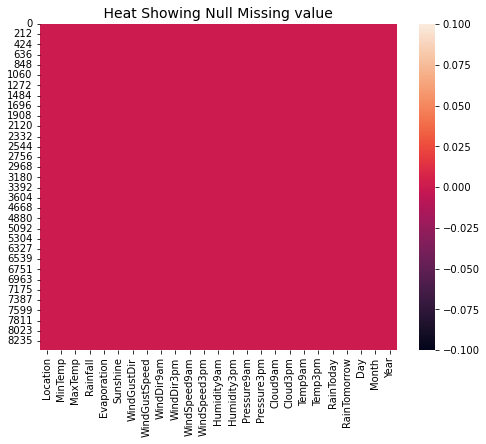

In [30]:
# Visualization on heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.title(" Heat Showing Null Missing value ", fontsize=14)

# EDA (Exploratory Data Analysis)

### Univariate Analysis

Name of the location of the weather station
 PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


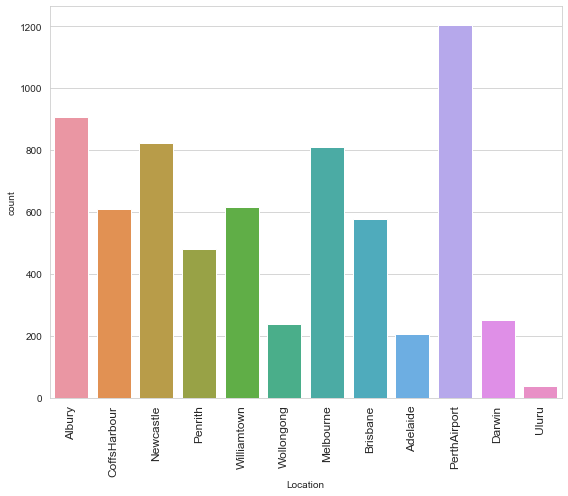

In [31]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.countplot(x='Location',data=df)
print("Name of the location of the weather station\n",df['Location'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Graph Location Shows:

- PerthAirport    1204
- Albury           907
- Newcastle        822
- Melbourne        811
- Williamtown      615
- CoffsHarbour     611
- Brisbane         579
- Penrith          482
- Darwin           250
- Wollongong       237
- Adelaide         205
- Uluru             39

### Maximum prediction is done from Perth Airport weather station and Uluru Shows the lowest prediction.

Minimum Temp  -2.0 Maximum Temp  28.5


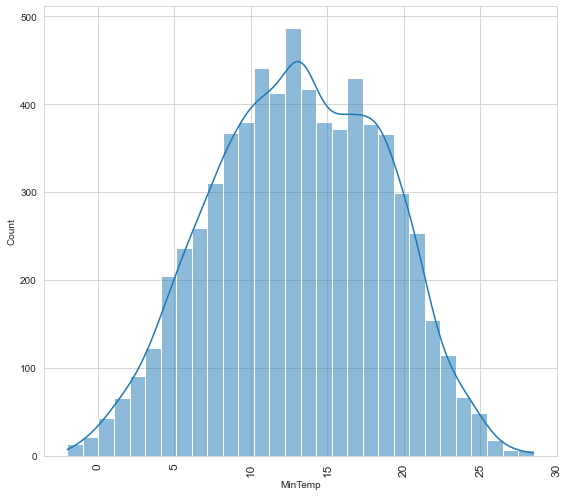

In [32]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='MinTemp',data=df,bins=30,kde=True)
print("Minimum Temp ",df['MinTemp'].min(),"Maximum Temp ",df['MinTemp'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Column MinTemp shows:  
- Minimum Temp  -2.0
- Maximum Temp  28.5

#### Maximum Frequency/counts Lies between 10 to 15

Minimum Temp  8.2 Maximum Temp  45.5


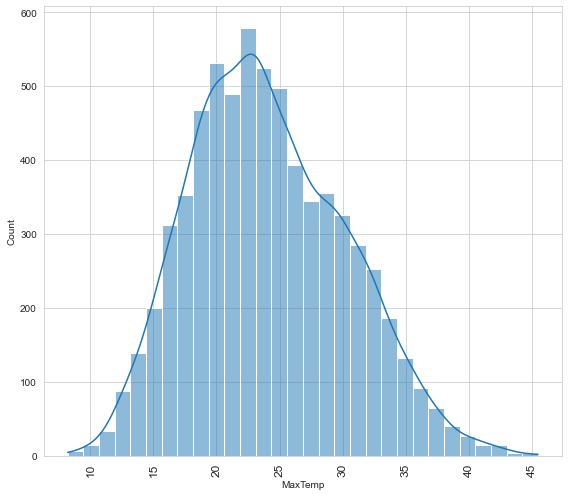

In [33]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='MaxTemp',data=df,bins=30,kde=True)
print("Minimum Temp ",df['MaxTemp'].min(),"Maximum Temp ",df['MaxTemp'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

MaxTemp Column Shows:

- Minimum Temp  8.2 
- Maximum Temp  45.5

#### Maximum MaxTemp lies between 20 to 25. 

Minimum Rainfall  0.0 Maximum Rainfall  371.0


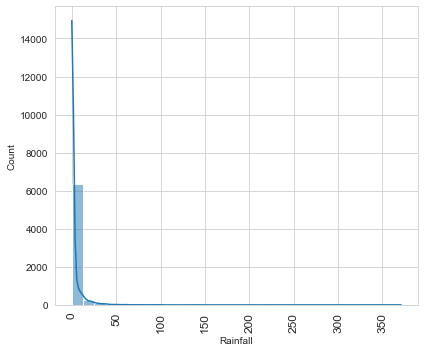

In [34]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Rainfall',data=df,bins=30,kde=True)
print("Minimum Rainfall ",df['Rainfall'].min(),"Maximum Rainfall ",df['Rainfall'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Frequency lies between 0 to 50

#### Rainfall Graph Shows " Minimum Rainfall  0.0 Maximum Rainfall  371.0

Minimum Evaporation  0.0 Maximum Evaporation  145.0


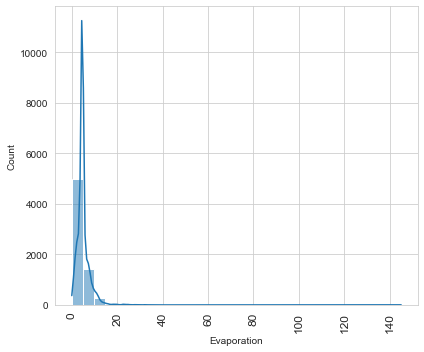

In [35]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Evaporation',data=df,bins=30,kde=True)
print("Minimum Evaporation ",df['Evaporation'].min(),"Maximum Evaporation ",df['Evaporation'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Evaporation count lies between 0 to 15

#### Minimum Evaporation  0.0 Maximum Evaporation  145.0

Minimum Sunshine  0.0 Maximum Sunshine  13.9


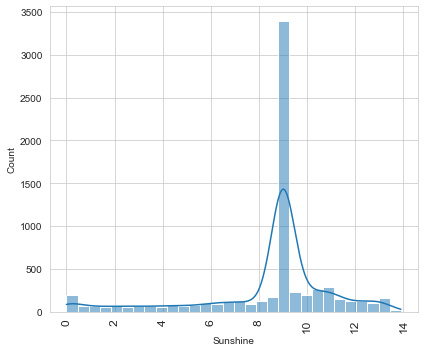

In [36]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Sunshine',data=df,bins=30,kde=True)
print("Minimum Sunshine ",df['Sunshine'].min(),"Maximum Sunshine ",df['Sunshine'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Maximum Frequency lies between 8 to 10

#### Minimum Sunshine  0.0 Maximum Sunshine  13.9

The direction of the strongest wind gust in the 24 hours to midnight
 E      1460
SW      465
N       459
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: WindGustDir, dtype: int64


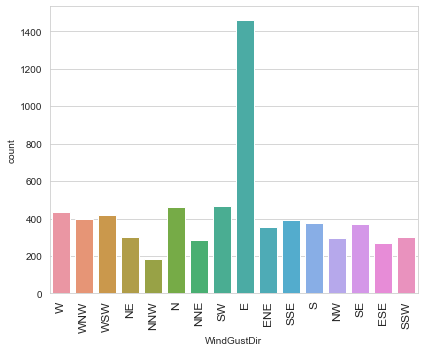

In [37]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='WindGustDir',data=df)
print("The direction of the strongest wind gust in the 24 hours to midnight\n",df['WindGustDir'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

Column Shows:

- E      1460
- SW      465
- N       459
- W       434
- WSW     420
- WNW     398
- SSE     390
- S       376
- SE      370
- ENE     357
- NE      300
- SSW     299
- NW      296
- NNE     287
- ESE     267
- NNW     184

#### Brief increase in the speed towards  East Direction having Maximum Count  1460 and Minimum Counts toward NNW 184

Minimum WindGustSpeed  7.0 Maximum WindGustSpeed  107.0


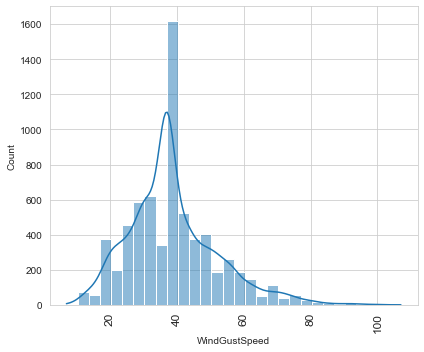

In [38]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='WindGustSpeed',data=df,bins=30,kde=True)
print("Minimum WindGustSpeed ",df['WindGustSpeed'].min(),"Maximum WindGustSpeed ",df['WindGustSpeed'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

- Minimum WindGustSpeed is 7.0 
- Maximum WindGustSpeed is 107.0

#### Brief increase in the speed of the wind Maximum Frequency lies between  30 to 40

The Direction of the wind at 9am
 N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: WindDir9am, dtype: int64


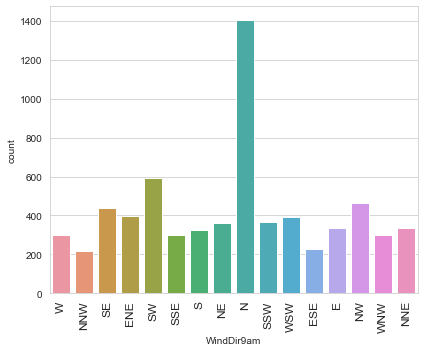

In [39]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='WindDir9am',data=df)
print("The Direction of the wind at 9am\n",df['WindDir9am'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

The Direction of the wind at 9 am shows various directions counts
- N      1403
- SW      590
- NW      463
- SE      439
- ENE     397
- WSW     394
- SSW     368
- NE      364
- E       338
- NNE     337
- S       324
- WNW     301
- SSE     300
- W       299
- ESE     229
- NNW     216

Maximum Wind at 9 am blows through North.

The Direction of the wind at 3pm 
 SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64


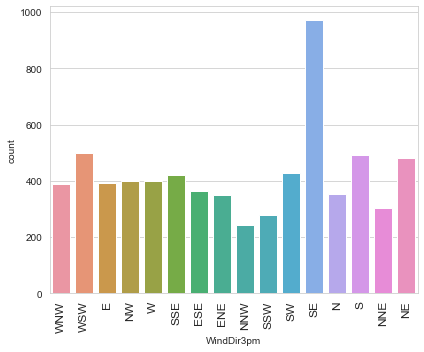

In [40]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='WindDir3pm',data=df)
print("The Direction of the wind at 3pm \n",df['WindDir3pm'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.tight_layout()

The Direction of the wind at 3pm shows various Direction Wind Flow. 
- SE     971
- WSW    499
- S      493
- NE     480
- SW     428
- SSE    421
- NW     400
- W      399
- E      392
- WNW    389
- ESE    363
- N      354
- ENE    348
- NNE    305
- SSW    277
- NNW    243

#### Maximum Winds Blows towards South East, North-NorthWest Shows

Minimum Wind Speed at 9am  0.0 Maximum Wind Speed at 9am  63.0


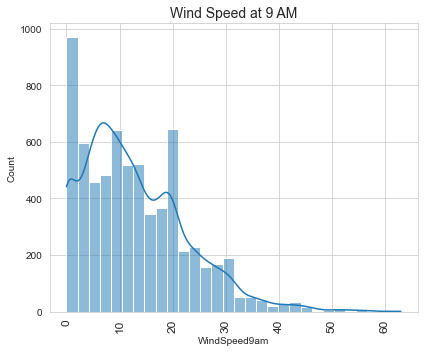

In [41]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='WindSpeed9am',data=df,bins=30,kde=True)
print("Minimum Wind Speed at 9am ",df['WindSpeed9am'].min(),"Maximum Wind Speed at 9am ",df['WindSpeed9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

- Minimum Wind Speed at 9am  0.0
- Maximum Wind Speed at 9am  63.0

#### Maximum Wind Speed By 9 AM lies 0 to 10 followed by 10 to 20

Minimum Wind Speed at 3pm  0.0 Maximum Wind Speed at 3pm  83.0


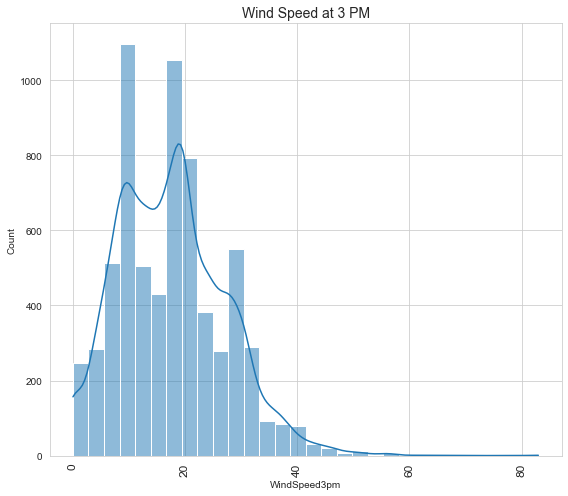

In [42]:
plt.figure(figsize=(8,7))
sns.set_style("whitegrid")
sns.histplot(x='WindSpeed3pm',data=df,bins=30,kde=True)
print("Minimum Wind Speed at 3pm ",df['WindSpeed3pm'].min(),"Maximum Wind Speed at 3pm ",df['WindSpeed3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Wind Speed at 3 PM",fontsize=14)
plt.tight_layout()

- Minimum Wind Speed at 3pm  00.0 
- Maximum Wind Speed at 3pm  83.0

#### Maximum Wind Speed Frequency lies between 10 to 20

Minimum Humidity at 9am  10.0 Maximum Humidity at 9am  100.0


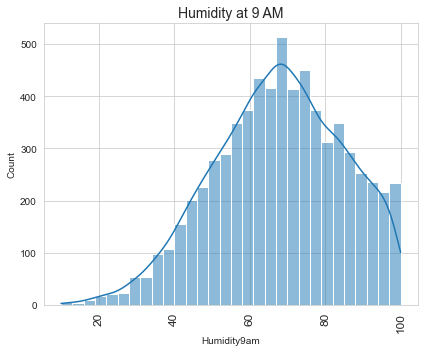

In [43]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Humidity9am',data=df,bins=30,kde=True)
print("Minimum Humidity at 9am ",df['Humidity9am'].min(),"Maximum Humidity at 9am ",df['Humidity9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Humidity at 9 AM",fontsize=14)
plt.tight_layout()

Minimum Humidity at 9am  10.0
Maximum Humidity at 9am  100.0

Minimum Humidity at 3PM 6.0 Maximum Humidity3pm  99.0


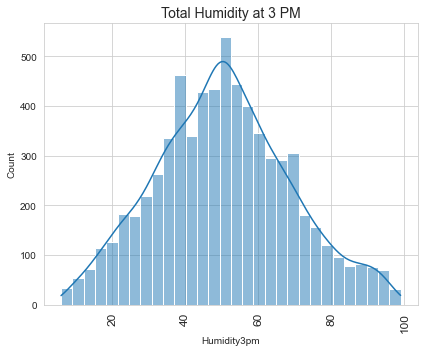

In [44]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Humidity3pm',data=df,bins=30,kde=True)
print("Minimum Humidity at 3PM",df['Humidity3pm'].min(),"Maximum Humidity3pm ",df['Humidity3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Total Humidity at 3 PM",fontsize=14)
plt.tight_layout()

Minimum Pressure at 9am  989.8 Maximum Pressure at 9am  1039.0


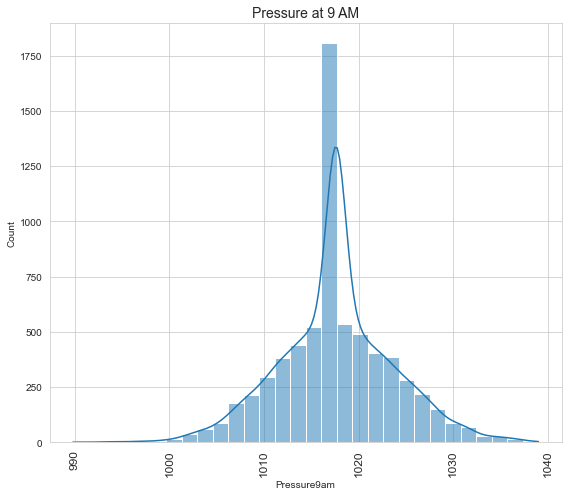

In [45]:
plt.figure(figsize=(8,7))
sns.histplot(x='Pressure9am',data=df,bins=30,kde=True)
print("Minimum Pressure at 9am ",df['Pressure9am'].min(),"Maximum Pressure at 9am ",df['Pressure9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Pressure at 9 AM",fontsize=14)
plt.tight_layout()

- Minimum Pressure at 9am  989.8 
- Maximum Pressure at 9am  1039.0

#### Maximum PRESSURE LIES at 9AM between 105 to 1021

Minimum Pressure at 3pm  982.9 Maximum Pressure at 3pm  1036.0


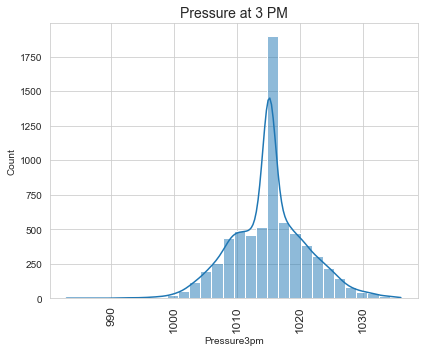

In [46]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Pressure3pm',data=df,bins=30,kde=True)
print("Minimum Pressure at 3pm ",df['Pressure3pm'].min(),"Maximum Pressure at 3pm ",df['Pressure3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Pressure at 3 PM",fontsize=14)
plt.tight_layout()

Minimum Cloud At 9 AM  0.0 Maximum Cloud At 9 AM  8.0


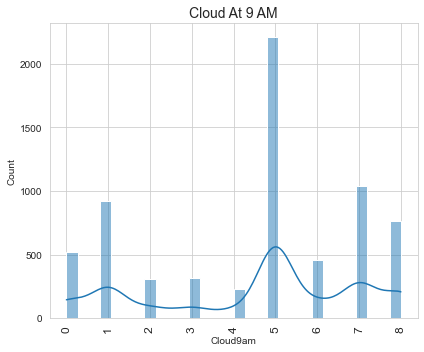

In [47]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Cloud9am',data=df,bins=30,kde=True)
print("Minimum Cloud At 9 AM ",df['Cloud9am'].min(),"Maximum Cloud At 9 AM ",df['Cloud9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Cloud At 9 AM",fontsize=14)
plt.tight_layout()

- Minimum Cloud At 9 AM  0.0 
- Maximum Cloud At 9 AM  8.0

- Maximum frequency lies at 5

Minimum Temp at 3PM  7.3 Maximum Temp st 3 PM 44.1


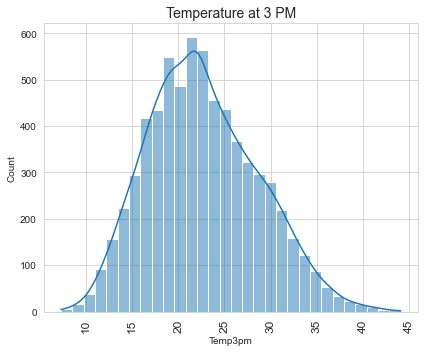

In [48]:
plt.figure(figsize=(6,5))
sns.histplot(x='Temp3pm',data=df,bins=30,kde=True)
print("Minimum Temp at 3PM ",df['Temp3pm'].min(),"Maximum Temp st 3 PM",df['Temp3pm'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Temperature at 3 PM",fontsize=14)
plt.tight_layout()

- Minimum Temp at 3 PM  7.3
- Maximum Temp st 3 PM 44.1

Minimum Temp at 9 AM  1.9 Maximum Temperature at 9 AM  39.4


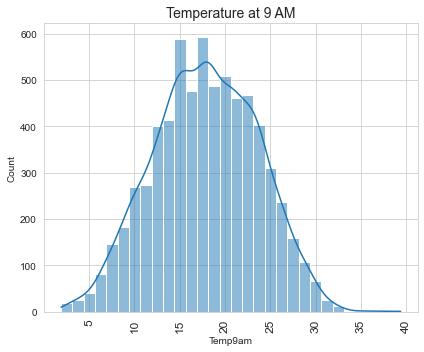

In [49]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.histplot(x='Temp9am',data=df,bins=30,kde=True)
print("Minimum Temp at 9 AM ",df['Temp9am'].min(),"Maximum Temperature at 9 AM ",df['Temp9am'].max())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Temperature at 9 AM",fontsize=14)
plt.tight_layout()

- Minimum Temp at 9 AM  1.9 
- Maximum Temperature at 9 AM  39.4

 Counts Showing Rain 
 No     5190
Yes    1572
Name: RainToday, dtype: int64


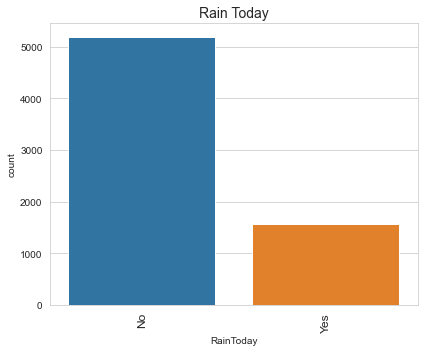

In [50]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='RainToday',data=df)
print(" Counts Showing Rain \n",df['RainToday'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=10)
plt.title("Rain Today",fontsize=14)
plt.tight_layout()

Counts Showing Rain 
- No     5190
- Yes    1572

 Counts Showing Rain Tomorrow 
 No     5190
Yes    1572
Name: RainTomorrow, dtype: int64


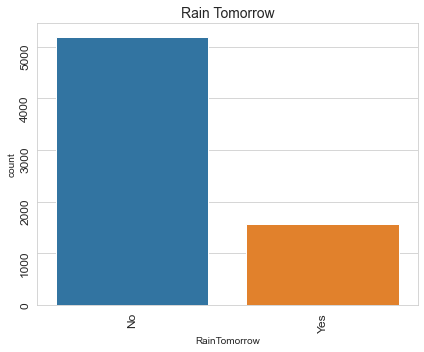

In [51]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='RainTomorrow',data=df)
print(" Counts Showing Rain Tomorrow \n",df['RainTomorrow'].value_counts())
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=90,fontsize=12)
plt.title("Rain Tomorrow",fontsize=14)
plt.tight_layout()

Counts Showing Rain Tomorrow 
- No     5190
- Yes    1572

# Bi-Variate Analysis

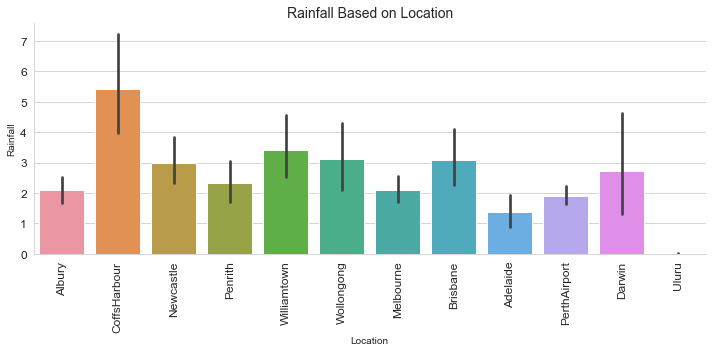

In [52]:
sns.catplot(kind='bar',x='Location',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Location",fontsize=14)
plt.tight_layout()

Adelaide shows lowest rainfall and CoffsHarbour Shows Maximum Rain

<Figure size 576x432 with 0 Axes>

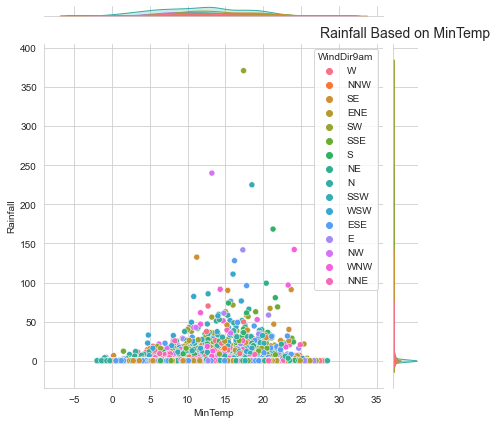

In [53]:
plt.figure(figsize=(8,6))
sns.jointplot(x='MinTemp',y='Rainfall',hue='WindDir9am',data=df,height=6,ratio=10)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

Maximum rain lies between Min Temp 10 to 20

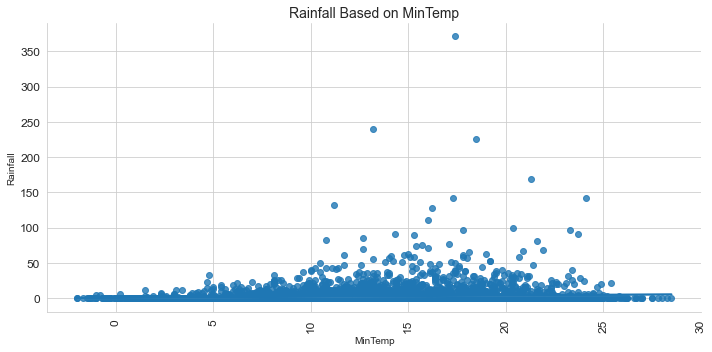

In [54]:
sns.lmplot(x='MinTemp',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

Maximum rain lies between Min Temp 10 to 20

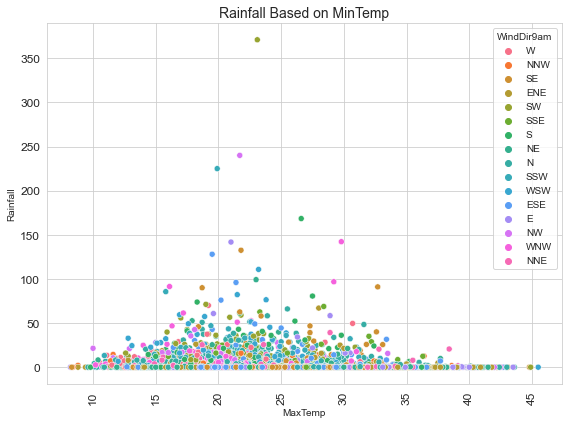

In [55]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='MaxTemp',y='Rainfall',hue='WindDir9am',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

As MaximumTemperature shows Maximum rainfall in Temp range 15 to 25 shows maximum rain.

<Figure size 432x360 with 0 Axes>

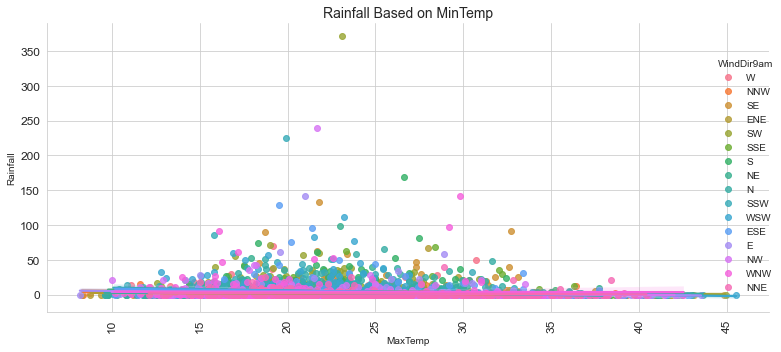

In [56]:
plt.figure(figsize=(6,5))
sns.lmplot(x='MaxTemp',y='Rainfall',hue='WindDir9am',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

As MaximumTemperature shows Maximum rainfall in Temp range 15 to 25 shows maximum rain.

<Figure size 432x360 with 0 Axes>

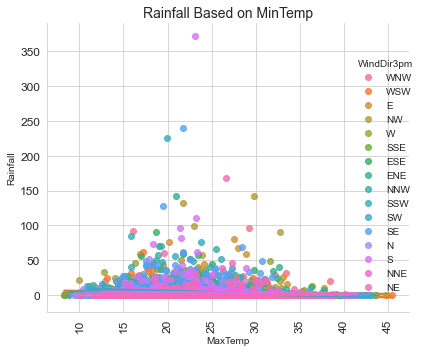

In [57]:
plt.figure(figsize=(6,5))
sns.lmplot(x='MaxTemp',y='Rainfall',hue='WindDir3pm',data=df,aspect=1)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on MinTemp",fontsize=14)
plt.tight_layout()

North wind case the maximum rain

<Figure size 432x360 with 0 Axes>

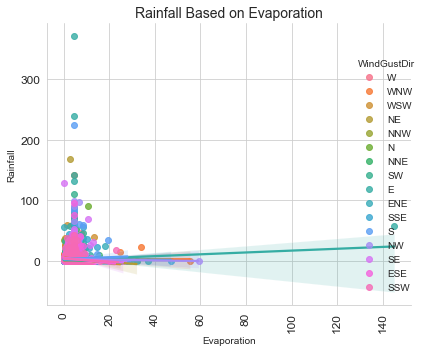

In [58]:
plt.figure(figsize=(6,5))
sns.lmplot(x='Evaporation',y='Rainfall',hue='WindGustDir',data=df,aspect=1)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Evaporation",fontsize=14)
plt.tight_layout()

East Wind plays a high role in rainfall, Humidity is a minor factor for rain

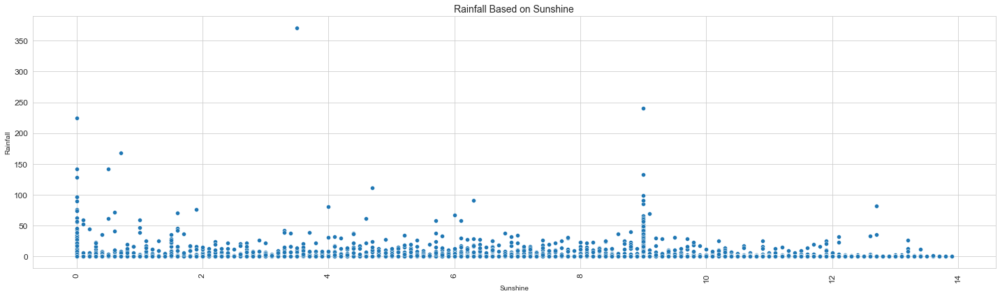

In [59]:
plt.figure(figsize=(20,6))
sns.scatterplot(x='Sunshine',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Sunshine",fontsize=14)
plt.tight_layout()

Don't show a good relation with Rainfall

<Figure size 432x360 with 0 Axes>

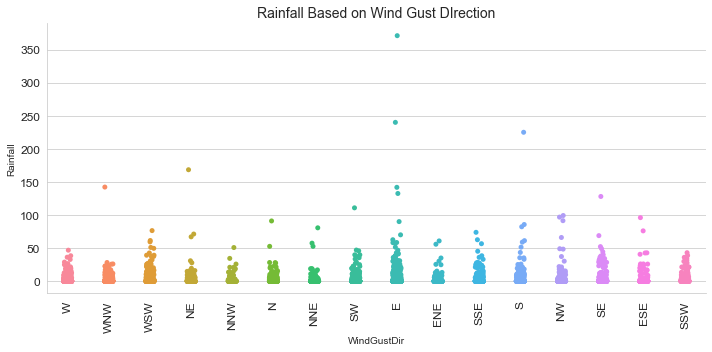

In [60]:
plt.figure(figsize=(6,5))
sns.catplot(x='WindGustDir',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Gust DIrection",fontsize=14)
plt.tight_layout()

East, WSW plays an important factor for rain followed by others 

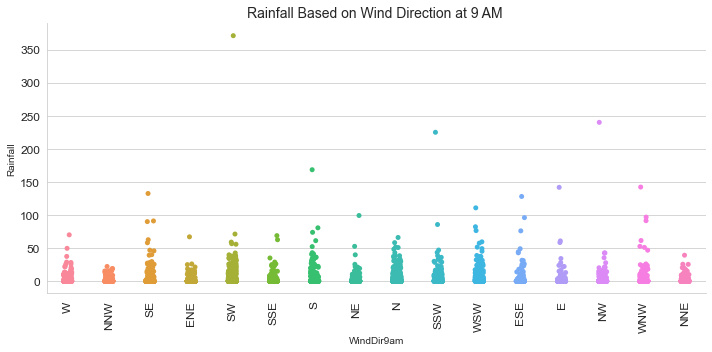

In [61]:
sns.catplot(x='WindDir9am',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Direction at 9 AM ",fontsize=14)
plt.tight_layout()

 Wind Gust Direction Shows East, WSW plays an important factor for rain followed by others 

<Figure size 576x432 with 0 Axes>

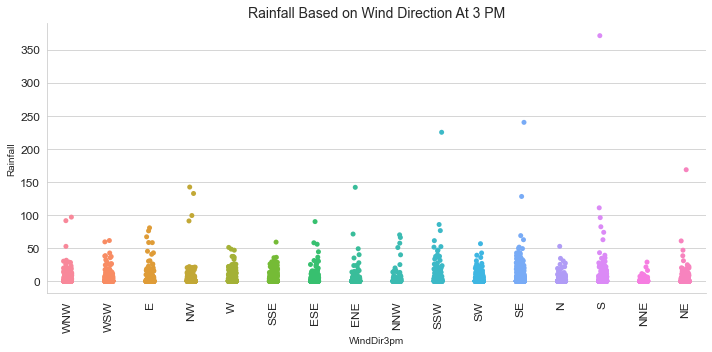

In [62]:
plt.figure(figsize=(8,6))
sns.catplot(x='WindDir3pm',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Direction At 3 PM",fontsize=14)
plt.tight_layout()

SE is main cause of Rain

<Figure size 432x360 with 0 Axes>

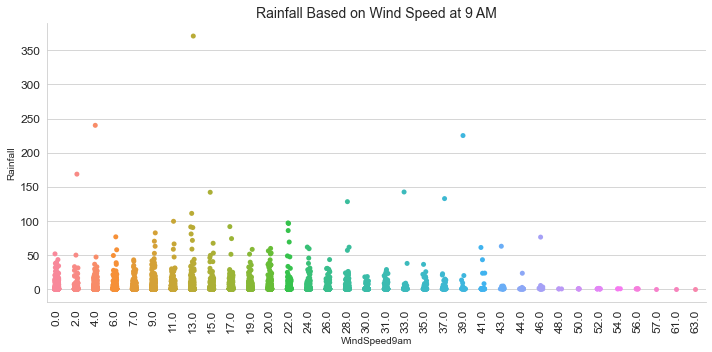

In [63]:
plt.figure(figsize=(6,5))
sns.catplot(x='WindSpeed9am',y='Rainfall',data=df,aspect=2,kind='strip')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

Maximum High reported is 39

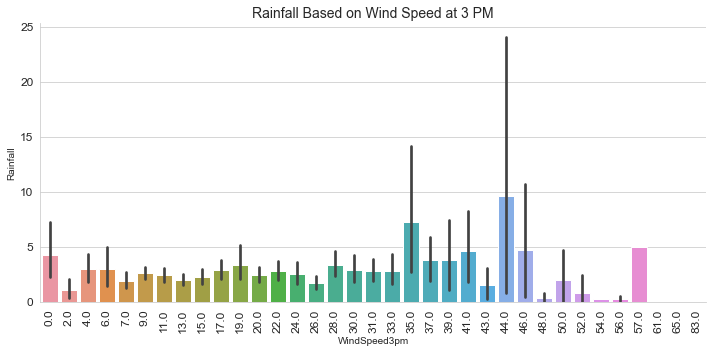

In [64]:
sns.catplot(x='WindSpeed3pm',y='Rainfall',data=df,aspect=2,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Wind Speed at 3 PM",fontsize=14)
plt.tight_layout()

Maximum High reported is at 44

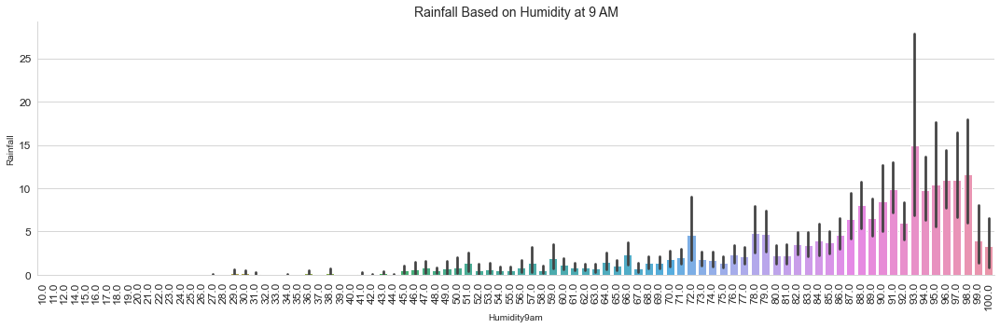

In [65]:
sns.catplot(x='Humidity9am',y='Rainfall',data=df,aspect=3,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Humidity at 9 AM",fontsize=14)
plt.tight_layout()

Maximum Humidity lies 64 to 100

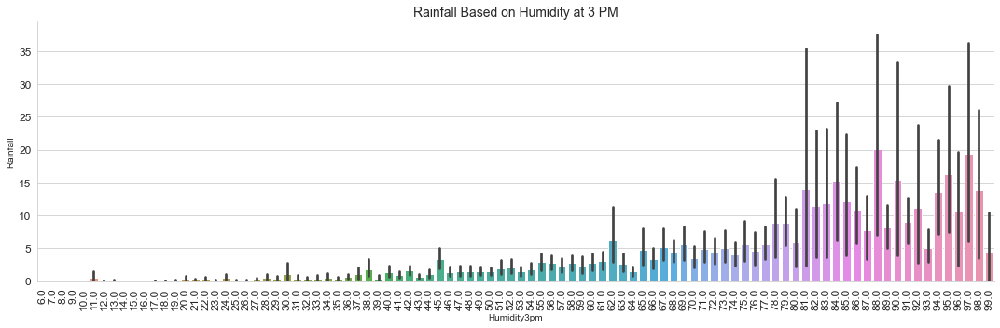

In [66]:
sns.catplot(x='Humidity3pm',y='Rainfall',data=df,aspect=3,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Humidity at 3 PM",fontsize=14)
plt.tight_layout()

Maximum Humidity lies from 81 to  98

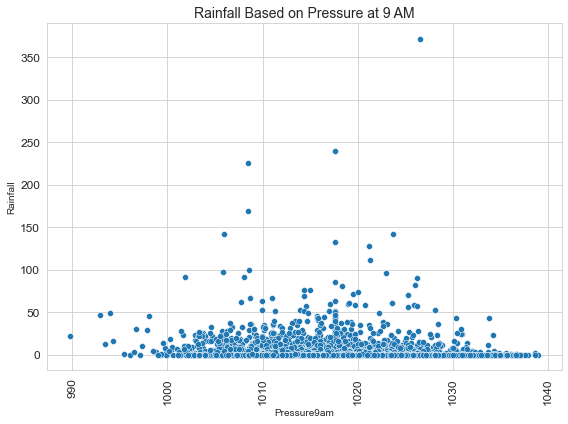

In [67]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='Pressure9am',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Pressure at 9 AM",fontsize=14)
plt.tight_layout()

Pressure is maximum between 1010 and 1020 casuse of rain

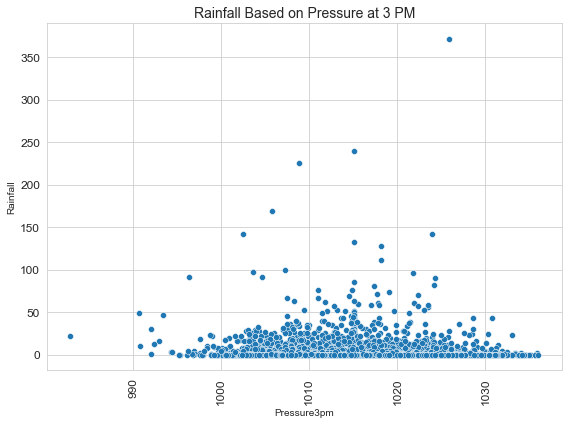

In [68]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='Pressure3pm',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Pressure at 3 PM",fontsize=14)
plt.tight_layout()

Pressure 3pm Shows Maximum Rain between 1010 to 1020

<Figure size 576x432 with 0 Axes>

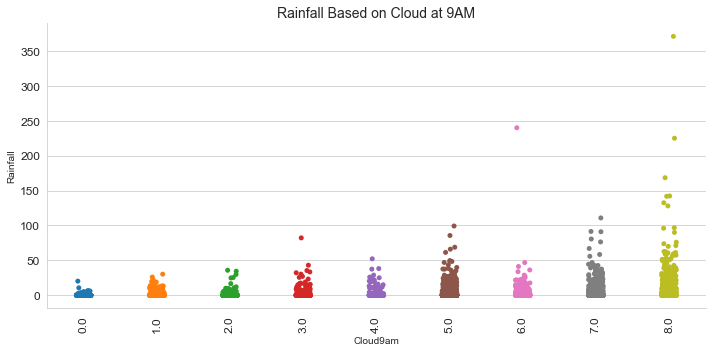

In [69]:
plt.figure(figsize=(8,6))
sns.catplot(x='Cloud9am',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Cloud at 9AM",fontsize=14)
plt.tight_layout()

Clouds are maximum at 8

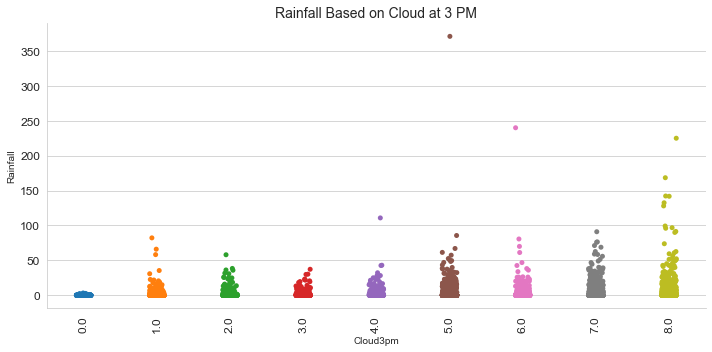

In [70]:
sns.catplot(x='Cloud3pm',y='Rainfall',data=df,aspect=2)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Cloud at 3 PM",fontsize=14)
plt.tight_layout()

Clouds maximum at 8 

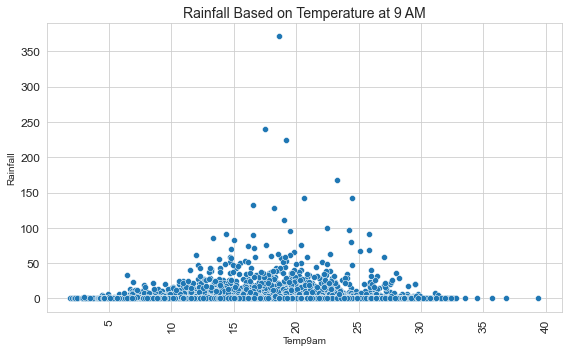

In [71]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='Temp9am',y='Rainfall',data=df)
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Temperature at 9 AM",fontsize=14)
plt.tight_layout()

Maximum Temp at 9 am lies between 10 to 25 

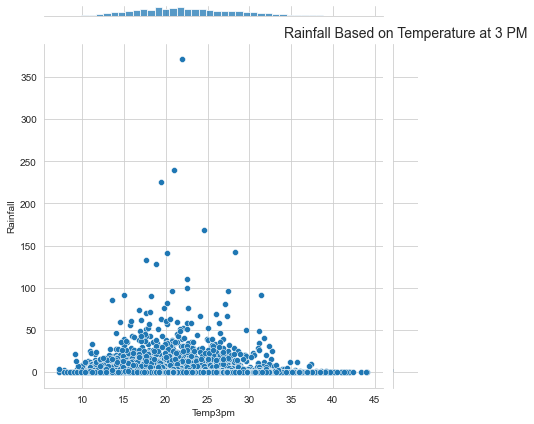

In [72]:
sns.jointplot(x='Temp3pm',y='Rainfall',data=df,ratio=10,kind='scatter')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall Based on Temperature at 3 PM",fontsize=14)
plt.tight_layout()

Temp3pm lies maximum lies between 15 to 30

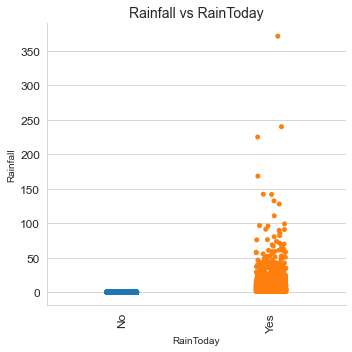

In [73]:
sns.catplot(x='RainToday',y='Rainfall',data=df,aspect=1,kind='strip')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall vs RainToday",fontsize=14)
plt.tight_layout()

Maximum Rain is Yes

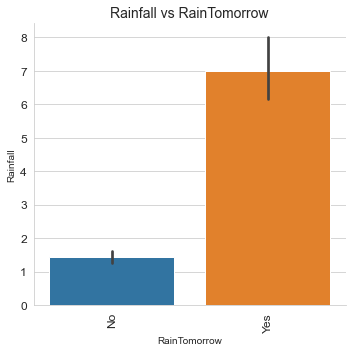

In [74]:
sns.catplot(x='RainTomorrow',y='Rainfall',data=df,aspect=1,kind='bar')
plt.xticks(rotation=90,fontsize=12)
plt.yticks(rotation=0,fontsize=12)
plt.title("Rainfall vs RainTomorrow",fontsize=14)
plt.tight_layout()

Maximum Rain Tomorrow is yes

### RainTomorrow Vs Other Aspects

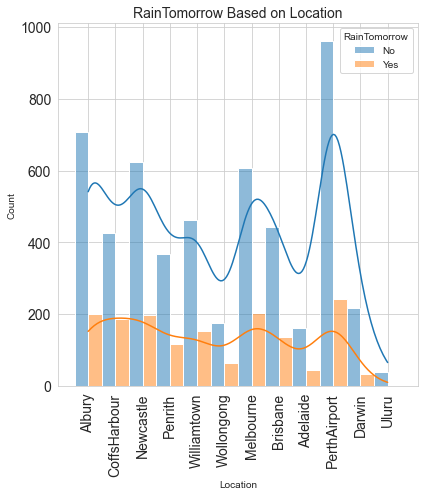

In [75]:
plt.figure(figsize=(6,7))
sns.histplot(x='Location',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Location",fontsize=14)
plt.tight_layout()

Maximum Rain Based on loction is  PerthAirport Followed by albury CoffsHarbour and Newcastle and other

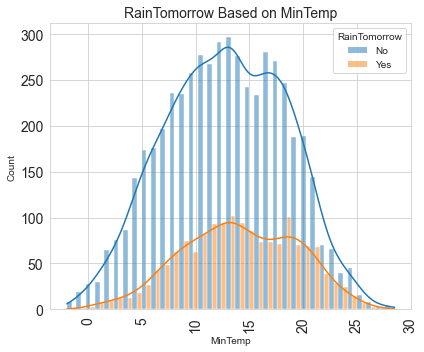

In [76]:
plt.figure(figsize=(6,5))
sns.histplot(x='MinTemp',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on MinTemp",fontsize=14)
plt.tight_layout()

Maximum Rain is between 10 to 20

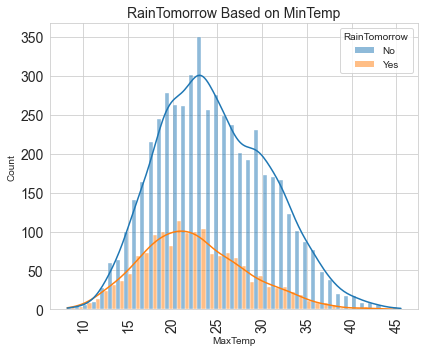

In [77]:
plt.figure(figsize=(6,5))
sns.histplot(x='MaxTemp',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on MinTemp",fontsize=14)
plt.tight_layout()

Maximum Rain is between 15 to 25

<Figure size 432x360 with 0 Axes>

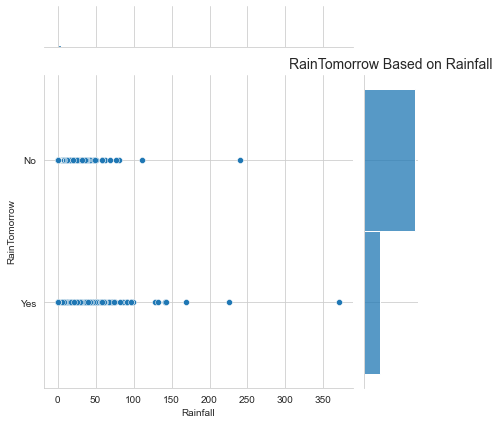

In [78]:
plt.figure(figsize=(6,5))
sns.jointplot(x='Rainfall',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Rainfall",fontsize=14)
plt.tight_layout()

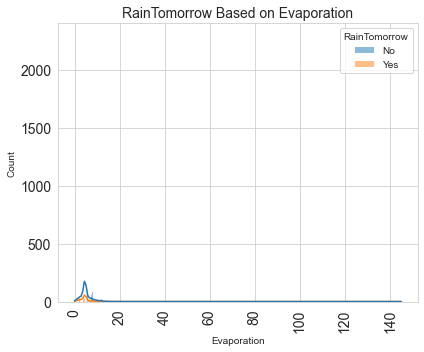

In [79]:
plt.figure(figsize=(6,5))
sns.histplot(x='Evaporation',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Evaporation",fontsize=14)
plt.tight_layout()

<Figure size 432x360 with 0 Axes>

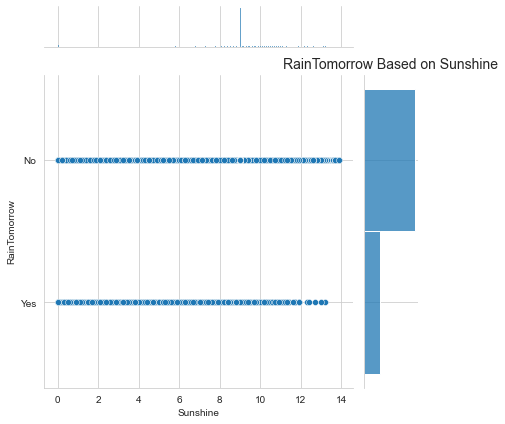

In [80]:
plt.figure(figsize=(6,5))
sns.jointplot(x='Sunshine',y='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Sunshine",fontsize=14)
plt.tight_layout()

Sunshine 8 to 10 increases the chance of rain

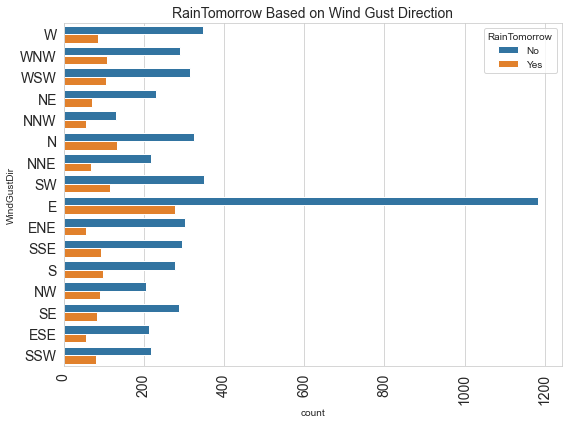

In [81]:
plt.figure(figsize=(8,6))
sns.countplot(y='WindGustDir',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Gust Direction",fontsize=14)
plt.tight_layout()

East Wind Gust Direction Shows high chance of Rainfall followed by others

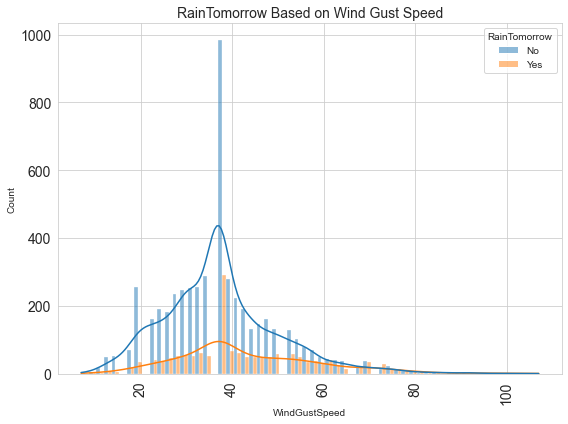

In [82]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindGustSpeed',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Gust Speed",fontsize=14)
plt.tight_layout()

Chance of rainfall is very high if speed of wind is 40

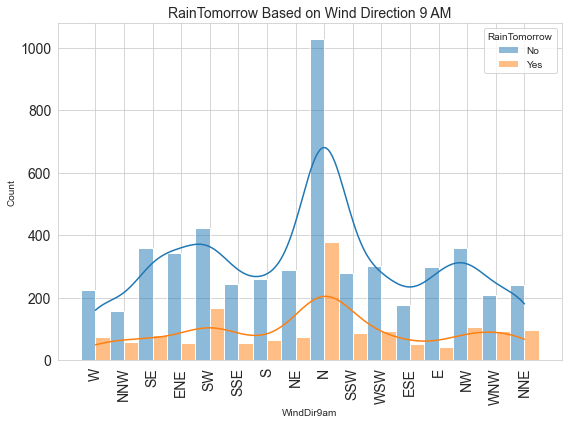

In [83]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindDir9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Direction 9 AM",fontsize=14)
plt.tight_layout()

- Maximum Wind Blow through North Shows high chance of rain

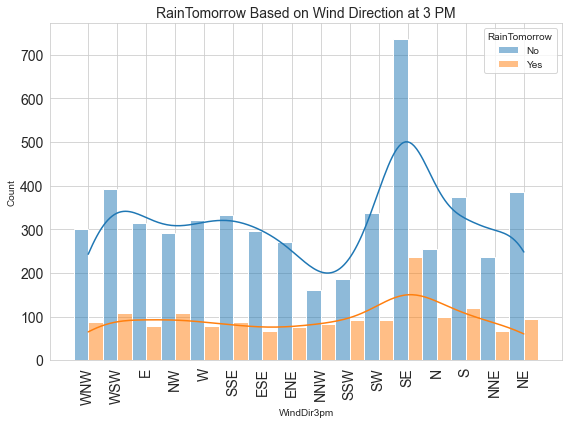

In [84]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindDir3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Direction at 3 PM",fontsize=14)
plt.tight_layout()

Maximum Wind blew through South East and North

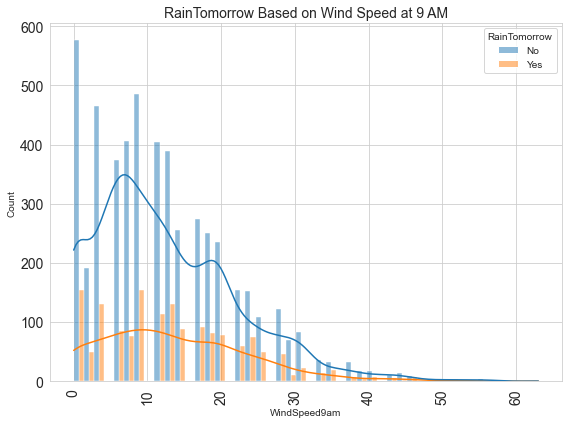

In [85]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindSpeed9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Speed at 9 AM",fontsize=14)
plt.tight_layout()

Maximum Rain lies between 0 to 20 speed

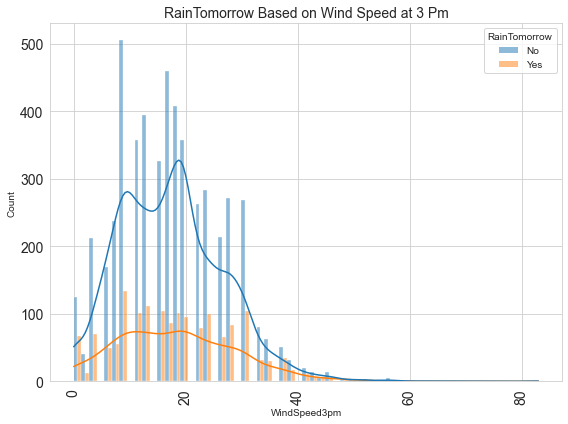

In [86]:
plt.figure(figsize=(8,6))
sns.histplot(x='WindSpeed3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Wind Speed at 3 Pm",fontsize=14)
plt.tight_layout()

WindSpeed3pm lies between 5 to 30

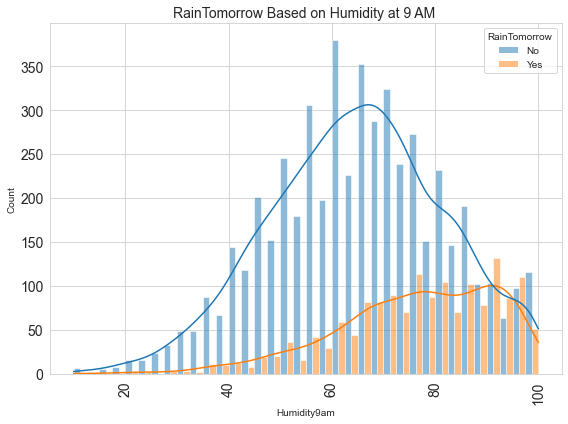

In [87]:
plt.figure(figsize=(8,6))
sns.histplot(x='Humidity9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Humidity at 9 AM ",fontsize=14)
plt.tight_layout()

Maximum Humidity9am lies 60 to 100 shows maximum Rain

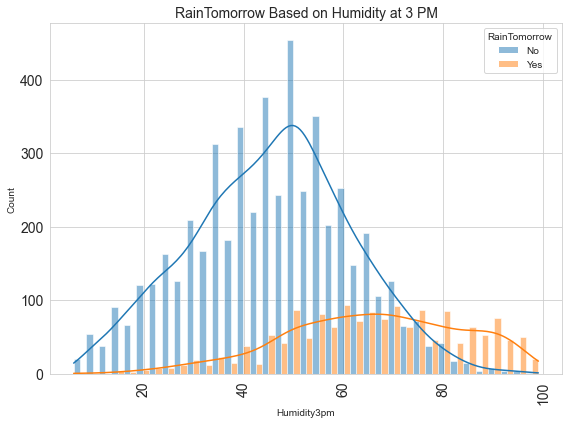

In [88]:
plt.figure(figsize=(8,6))
sns.histplot(x='Humidity3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Humidity at 3 PM",fontsize=14)
plt.tight_layout()

Maximum Humidity3pm lies 50 to 100 shows maximum Rain

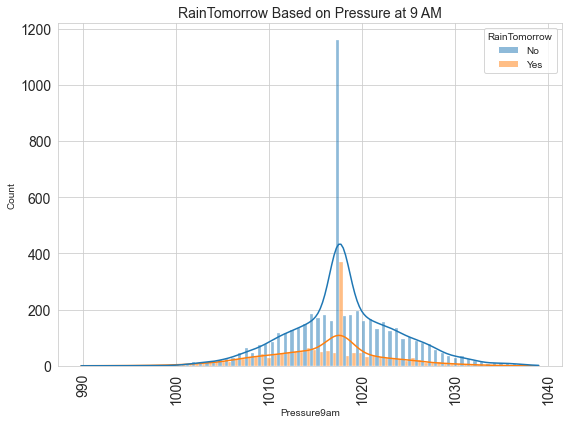

In [89]:
plt.figure(figsize=(8,6))
sns.histplot(x='Pressure9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Pressure at 9 AM",fontsize=14)
plt.tight_layout()

Pressure9am lies between 1015 to 1020

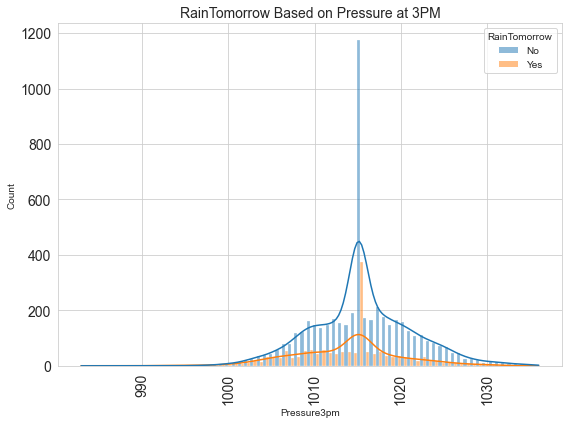

In [90]:
plt.figure(figsize=(8,6))
sns.histplot(x='Pressure3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Pressure at 3PM",fontsize=14)
plt.tight_layout()

Maximum pressure lies 1010 to 1020 shows maximum Rain

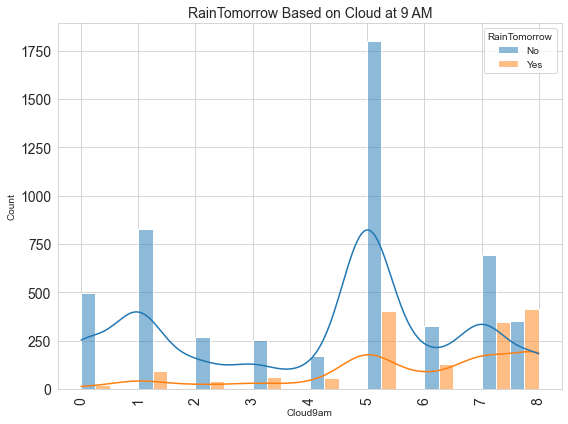

In [91]:
plt.figure(figsize=(8,6))
sns.histplot(x='Cloud9am',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Cloud at 9 AM",fontsize=14)
plt.tight_layout()

Cloud9am Shows maximum Rain at 5 ,7,8

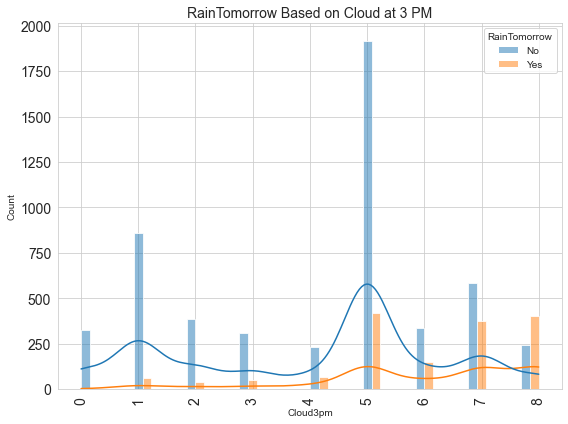

In [92]:
plt.figure(figsize=(8,6))
sns.histplot(x='Cloud3pm',hue='RainTomorrow',data=df,kde=True,multiple='dodge')
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow Based on Cloud at 3 PM",fontsize=14)
plt.tight_layout()

Cloud3pm Shows maximum Rain at 5 ,7,8

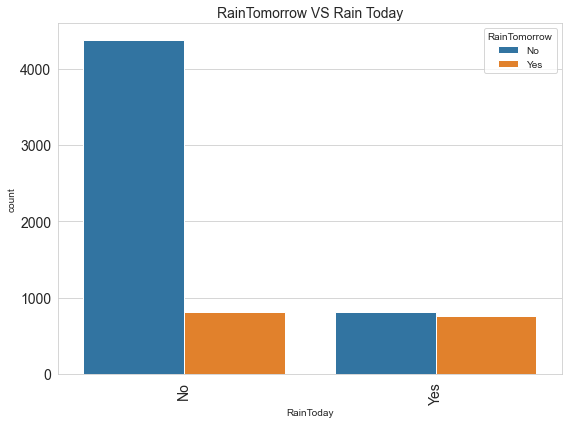

In [93]:
plt.figure(figsize=(8,6))
sns.countplot(x='RainToday',hue='RainTomorrow',data=df)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.title("RainTomorrow VS Rain Today",fontsize=14)
plt.tight_layout()

Maximum Rain Today shows No Rain

In [94]:
inf=df.groupby(["Location"])["RainTomorrow"].value_counts().sort_values().unstack()
inf

RainTomorrow,No,Yes
Location,,
Adelaide,160.0,45.0
Albury,708.0,199.0
Brisbane,444.0,135.0
CoffsHarbour,425.0,186.0
Darwin,218.0,32.0
Melbourne,608.0,203.0
Newcastle,624.0,198.0
Penrith,366.0,116.0
PerthAirport,962.0,242.0


Text(0.5, 1.0, 'Chance Of Rain As per Loacation')

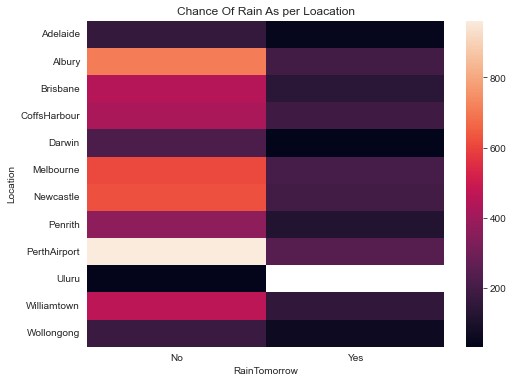

In [95]:
plt.figure(figsize=(8,6))
sns.heatmap(inf)
plt.title("Chance Of Rain As per Loacation")

# Multivariate Analysis

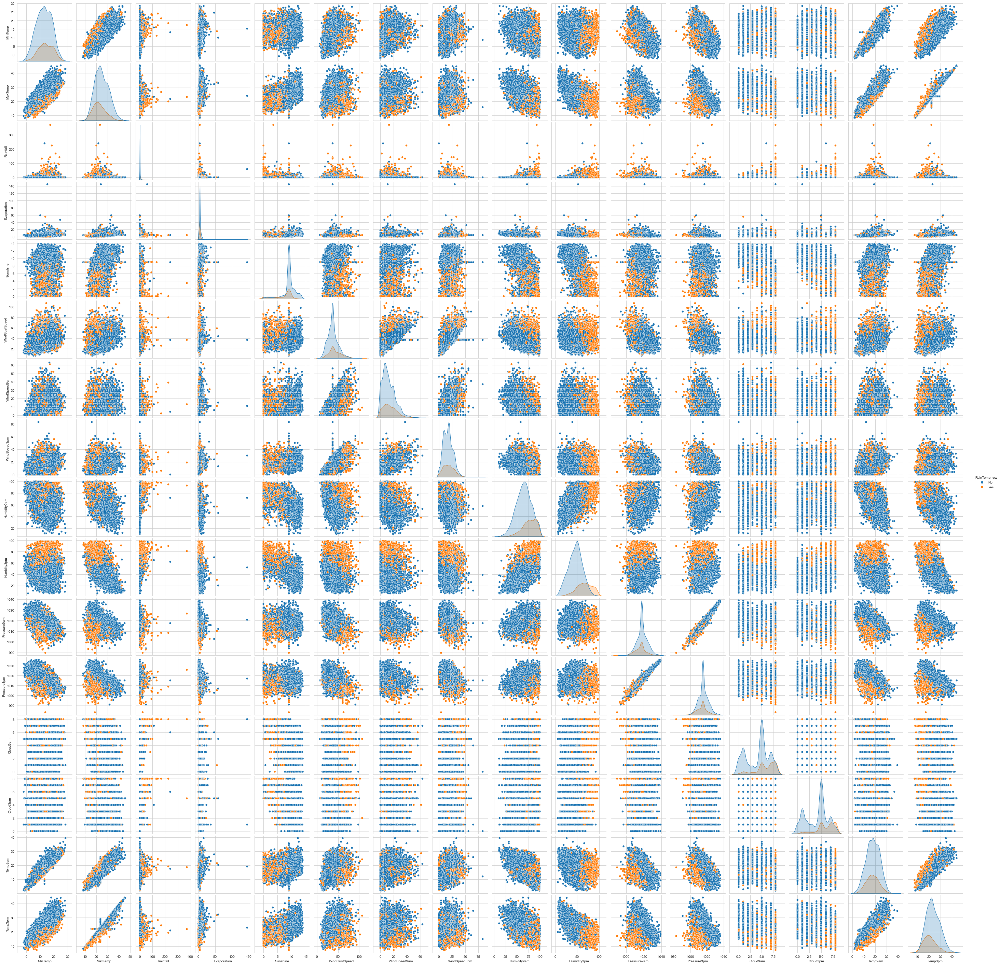

In [96]:
sns.pairplot(data=df,hue='RainTomorrow')

# Feature Engneering:

In [97]:
df['Avg_WindSpeed']=(df['WindSpeed9am']+df['WindSpeed3pm'])/2
df['Avg_Humidity']=(df['Humidity9am']+df['Humidity3pm']/2)
df['Avg_Cloud']=(df['Cloud9am']+df['Cloud3pm']/2)
df['Avg_Temp']=(df['Temp9am']+df['Temp3pm']/2)
df['Avg_Pressure']=(df['Pressure9am']+df['Pressure3pm']/2)

In [98]:
df.drop(['WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm','Pressure9am','Pressure3pm'],inplace=True,axis=1)

In [99]:
df.head(4)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,Albury,13.4,22.9,0.6,4.6,9.0,W,44.0,W,WNW,No,No,01,12,2008,22.0,82.0,10.5,27.80,1511.25
1,Albury,7.4,25.1,0.0,4.6,9.0,WNW,44.0,NNW,WSW,No,No,02,12,2008,13.0,56.5,7.5,29.35,1514.50
2,Albury,12.9,25.7,0.0,4.6,9.0,WSW,46.0,W,WSW,No,No,03,12,2008,22.5,53.0,6.0,32.60,1511.95
3,Albury,9.2,28.0,0.0,4.6,9.0,NE,24.0,SE,E,No,No,04,12,2008,10.0,53.0,7.5,31.35,1524.00


In [100]:
for i in df.columns:
    if df[i].dtype=='object':
        print(i,"\n",df[i].unique(),"\n***"*2)

Location 
 ['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru'] 
***
***
WindGustDir 
 ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'E' 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'SSW'] 
***
***
WindDir9am 
 ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' 'N' 'SSW' 'WSW' 'ESE' 'E' 'NW'
 'WNW' 'NNE'] 
***
***
WindDir3pm 
 ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' 'NE'] 
***
***
RainToday 
 ['No' 'Yes'] 
***
***
RainTomorrow 
 ['No' 'Yes'] 
***
***
Day 
 ['01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11' '12' '13' '14'
 '15' '16' '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28'
 '29' '30' '31'] 
***
***
Month 
 ['12' '01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11'] 
***
***
Year 
 ['2008' '2009' '2010' '2011' '2013' '2014' '2015' '2016' '2017' '2012'] 
***
***


### Taking This under consideration

- North-Northeast Wind = The wind comes from halfway between north and northeast.
- Northeast wind = the wind comes from halfway between North and East.
- East-Northeast Wind = The wind comes from halfway between NorthEast and East.
- East wind = the wind comes from the East.
- East-SouthEast Wind = The wind comes from halfway between southeast and east

so on....

In [101]:
#WindGustDir ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' 'E' 'ENE' 'SSE' 'S' 'NW' 'SE''ESE' 'SSW']
df['WindGustDir'].replace(['WNW','WSW','NNW','NNE','ENE','SSE','ESE','SSW'],['NW','SW','NW','NE','NE','SE','SE','SW'],inplace=True)
# WindDir9am ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' 'N' 'SSW' 'WSW' 'ESE' 'E' 'NW''WNW' 'NNE'] 
df['WindDir9am'].replace(['NNW','ENE','SSE','SSW','WSW','ESE','WNW','NNE'],['NW','NE','SE','SW','SW','SE','NW','NE'],inplace=True)
#WindDir3pm ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S''NNE' 'NE']
df['WindDir3pm'].replace(["WNW",'WSW','SSE','ESE','ENE','NNW','SSW','NNE'],['NW','SW','SE','SE','NE','NW','SW','NE'],inplace=True)

In [102]:
for i in df.columns:
    if df[i].dtype=='object':
        print(i,"\n",df[i].unique(),"\n***"*1)

Location 
 ['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru'] 
***
WindGustDir 
 ['W' 'NW' 'SW' 'NE' 'N' 'E' 'SE' 'S'] 
***
WindDir9am 
 ['W' 'NW' 'SE' 'NE' 'SW' 'S' 'N' 'E'] 
***
WindDir3pm 
 ['NW' 'SW' 'E' 'W' 'SE' 'NE' 'N' 'S'] 
***
RainToday 
 ['No' 'Yes'] 
***
RainTomorrow 
 ['No' 'Yes'] 
***
Day 
 ['01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11' '12' '13' '14'
 '15' '16' '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28'
 '29' '30' '31'] 
***
Month 
 ['12' '01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11'] 
***
Year 
 ['2008' '2009' '2010' '2011' '2013' '2014' '2015' '2016' '2017' '2012'] 
***


# Label Encoder

In [103]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

for i in df.columns:
    if df[i].dtype=='object':
        df[i]=le.fit_transform(df[i])

In [104]:
df.head(3)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,13.4,22.9,0.6,4.6,9.0,7,44.0,7,3,0,0,0,11,0,22.0,82.0,10.5,27.80,1511.25
1,1,7.4,25.1,0.0,4.6,9.0,3,44.0,3,6,0,0,1,11,0,13.0,56.5,7.5,29.35,1514.50
2,1,12.9,25.7,0.0,4.6,9.0,6,46.0,7,6,0,0,2,11,0,22.5,53.0,6.0,32.60,1511.95


# Checking Relationship with Variables

# Descriptive Statistics

In [105]:
df.describe(include='all')

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.00000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,5.323721,13.110086,24.093301,2.723410,4.99898,8.421665,3.218279,38.702159,3.383614,3.916001,0.232476,0.232476,14.737208,5.462141,4.052203,15.164153,92.740757,6.775806,29.245970,1525.179252
std,3.099455,5.540674,6.130367,10.490138,3.36177,2.789228,2.360807,13.393977,2.103128,1.928169,0.422442,0.422442,8.793898,3.377471,2.301057,8.516389,24.167082,3.332466,8.377505,8.937731
min,0.000000,-2.000000,8.200000,0.000000,0.00000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13.500000,0.000000,5.850000,1481.250000
25%,2.250000,9.000000,19.600000,0.000000,4.00000,8.800000,1.000000,30.000000,1.000000,2.000000,0.000000,0.000000,7.000000,3.000000,2.000000,9.000000,76.500000,4.500000,23.200000,1520.112500
50%,6.000000,13.200000,23.500000,0.000000,4.60000,9.000000,3.000000,37.000000,3.000000,4.000000,0.000000,0.000000,15.000000,5.000000,4.000000,14.000000,93.500000,7.500000,29.050000,1525.150000
75%,8.000000,17.400000,28.400000,0.800000,5.00000,9.200000,5.000000,46.000000,5.000000,5.000000,0.000000,0.000000,22.000000,8.000000,6.000000,20.500000,110.000000,9.000000,35.400000,1530.050000
max,11.000000,28.500000,45.500000,371.000000,145.00000,13.900000,7.000000,107.000000,7.000000,7.000000,1.000000,1.000000,30.000000,11.000000,9.000000,60.000000,148.500000,12.000000,56.750000,1556.800000


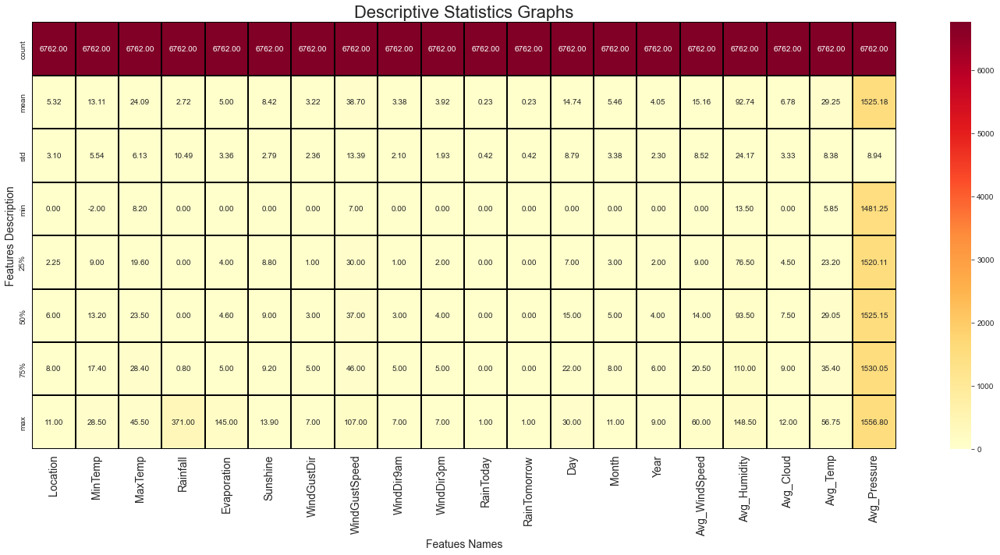

In [106]:
plt.figure(figsize=(20,10))
sns.heatmap(df.describe(),annot=True,linewidth=0.02,linecolor='black',fmt='0.2f',cmap='YlOrRd')
plt.title("Descriptive Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features Description',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.tight_layout()

# Few Observation :
----------------------------

- Null Values: No Null Values
- Right Skewed: Nill
- Left Skewed: Nill
- Standard Deviation is more: WindGustSpeed, Rainfall, Humidity9am, Humidity3pm
- Maximum Outliers: Evaporation,Rainfall,WindGustSpeed,WindSpeed9am

# Correlation Graph

In [107]:
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
Location,1.000000,0.090455,0.070761,-0.004972,0.134965,0.068411,-0.092473,0.254955,-0.142647,0.038110,-0.004280,-0.004506,-0.000710,-0.067376,0.503047,0.266564,-0.024480,-0.020330,0.090863,-0.033843
MinTemp,0.090455,1.000000,0.728059,0.090971,0.284696,0.001976,-0.092517,0.242823,0.053516,-0.087809,0.075902,0.097173,0.014356,-0.237204,0.032974,0.202793,-0.083682,0.062566,0.857293,-0.444509
MaxTemp,0.070761,0.728059,1.000000,-0.087604,0.356420,0.323262,-0.150935,0.166300,-0.103593,-0.140212,-0.225526,-0.160063,0.016108,-0.171616,0.081092,0.097448,-0.467044,-0.272037,0.939518,-0.365683
Rainfall,-0.004972,0.090971,-0.087604,1.000000,-0.003746,-0.190464,0.026206,0.086519,0.088440,0.044450,0.461817,0.223599,-0.007989,-0.015187,-0.008516,0.040303,0.255070,0.191220,-0.035702,-0.058842
Evaporation,0.134965,0.284696,0.356420,-0.003746,1.000000,0.251882,-0.060756,0.177502,-0.040372,-0.019005,-0.113699,-0.077340,0.011120,-0.002998,0.114748,0.172591,-0.266572,-0.117487,0.354885,-0.209156
Sunshine,0.068411,0.001976,0.323262,-0.190464,0.251882,1.000000,-0.094539,-0.020876,-0.056948,-0.017840,-0.249807,-0.337550,0.000706,-0.005828,0.134089,-0.030267,-0.396541,-0.546587,0.249374,-0.014290
WindGustDir,-0.092473,-0.092517,-0.150935,0.026206,-0.060756,-0.094539,1.000000,-0.025850,0.367536,0.354135,0.098456,0.024747,0.009254,-0.000577,-0.190155,0.078540,0.009747,0.099038,-0.129665,-0.015823
WindGustSpeed,0.254955,0.242823,0.166300,0.086519,0.177502,-0.020876,-0.025850,1.000000,-0.083593,-0.004182,0.085641,0.184400,-0.002539,0.048189,-0.043982,0.699062,-0.233445,0.018668,0.198368,-0.386215
WindDir9am,-0.142647,0.053516,-0.103593,0.088440,-0.040372,-0.056948,0.367536,-0.083593,1.000000,0.193124,0.135672,0.012479,-0.024866,-0.014009,-0.132595,0.045643,-0.009162,0.043686,-0.030376,0.015109
WindDir3pm,0.038110,-0.087809,-0.140212,0.044450,-0.019005,-0.017840,0.354135,-0.004182,0.193124,1.000000,0.108777,-0.005802,-0.006632,-0.010822,0.059594,-0.022507,0.031531,0.056203,-0.122809,-0.021335


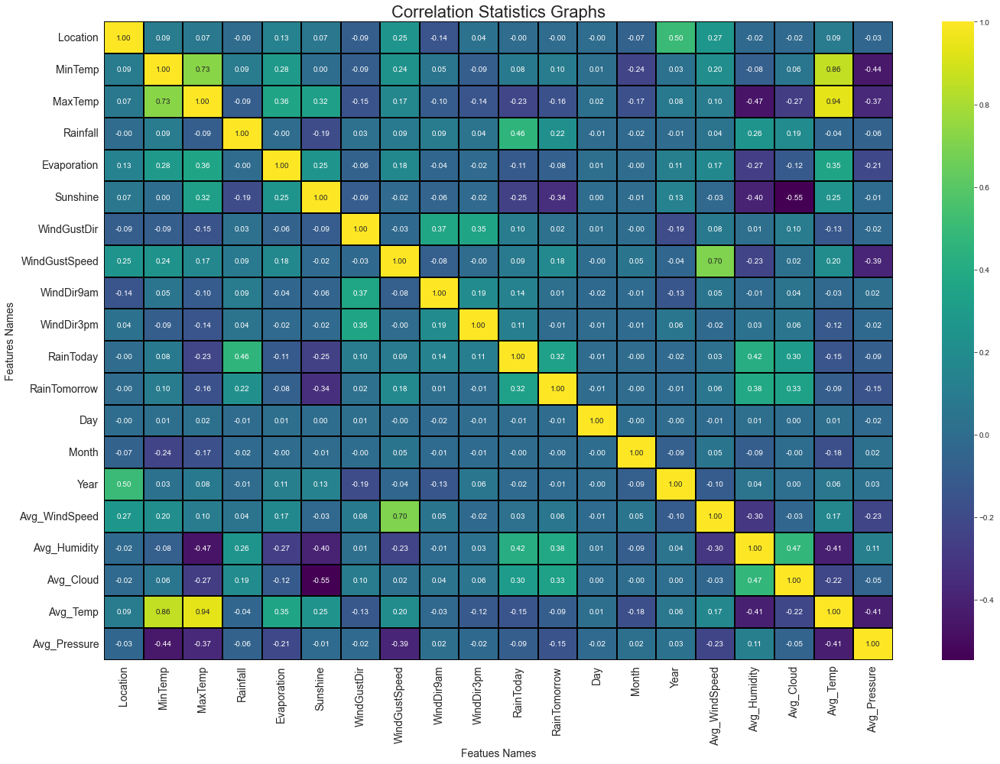

In [108]:
plt.figure(figsize=(20,14))
sns.heatmap(df.corr(),annot=True,linewidth=0.02,linecolor='black',fmt='0.2f',cmap='viridis')
plt.title("Correlation Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features Names',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

# Correlation For " Model Linear Regression"

In [109]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.190464
MaxTemp         -0.087604
Avg_Pressure    -0.058842
Avg_Temp        -0.035702
Month           -0.015187
Year            -0.008516
Day             -0.007989
Location        -0.004972
Evaporation     -0.003746
WindGustDir      0.026206
Avg_WindSpeed    0.040303
WindDir3pm       0.044450
WindGustSpeed    0.086519
WindDir9am       0.088440
MinTemp          0.090971
Avg_Cloud        0.191220
RainTomorrow     0.223599
Avg_Humidity     0.255070
RainToday        0.461817
Rainfall         1.000000
Name: Rainfall, dtype: float64

## Graph

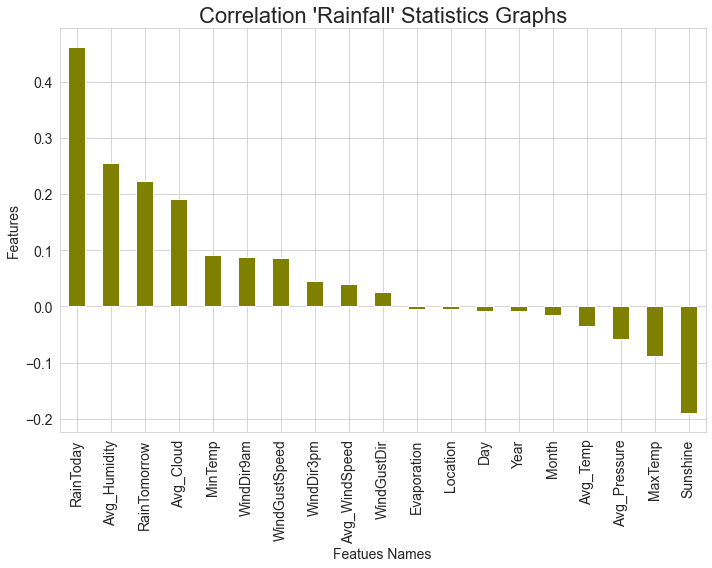

In [110]:
plt.figure(figsize=(10,8))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='olive')
plt.title("Correlation 'Rainfall' Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

## Observation

- Sunshine is 19 percentage Negatively Correlated with the Target Variable.
- Temp3pm  is 9 percentage Negatively Correlated with the Target Variable.
- MaxTemp  is 9 percentage Negatively Correlated with the Target Variable.
- Pressure9am is 7 percentage Negatively Correlated with the Target Variable.
- Pressure3pm  is 3 percentage Negatively Correlated with the Target Variable.
- Location is 1 percentage Negatively Correlated with the Target Variable.
- Temp9am  is 0 percentage Negatively Correlated with the Target Variable.
- Evaporation  is 0 percentage Negatively Correlated with the Target Variable.
- WindSpeed3pm is 2 percentage Positively COrrelated with the target Variable.
- WindGustDir is 3 percentage Positively Correlated with the Target Variable.
- WindDir3pm is 5 percentage Positively Correlated with the Target Variable.
- WindSpeed9am is 5 percentage Positively Correlated with the Target Variable.
- WindGustSpeed is 9 percentage Positively Correlated with the Target Variable.
- WindDir9am is 9 percentage Positively Correlated with the Target Variable.
- MinTemp is 9 percentage Positively Correlated with the Target Variable.  
- Cloud3pm is 15 percentage Positively Correlated with the Target Variable.
- Cloud9am is 18 percentage Positively Correlated with the Target Variable.
- RainTomorrow is 22 percentage Positively Correlated with the Target Variable.
- Humidity9am is 23 percentage Positively Correlated with the Target Variable.
- Humidity3pm is 24 percentage Positively Correlated with the Target Variable.
- RainToday is 46 percentage Positively Correlated with the Target Variable.

# Correlation for " Model Logistic Regression "

In [111]:
df.corr()['RainTomorrow'].sort_values()

Sunshine        -0.337550
MaxTemp         -0.160063
Avg_Pressure    -0.151306
Avg_Temp        -0.089881
Evaporation     -0.077340
Year            -0.014769
Day             -0.007560
WindDir3pm      -0.005802
Location        -0.004506
Month           -0.003575
WindDir9am       0.012479
WindGustDir      0.024747
Avg_WindSpeed    0.057616
MinTemp          0.097173
WindGustSpeed    0.184400
Rainfall         0.223599
RainToday        0.323691
Avg_Cloud        0.334781
Avg_Humidity     0.383315
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

# Graph Showing Correlation:

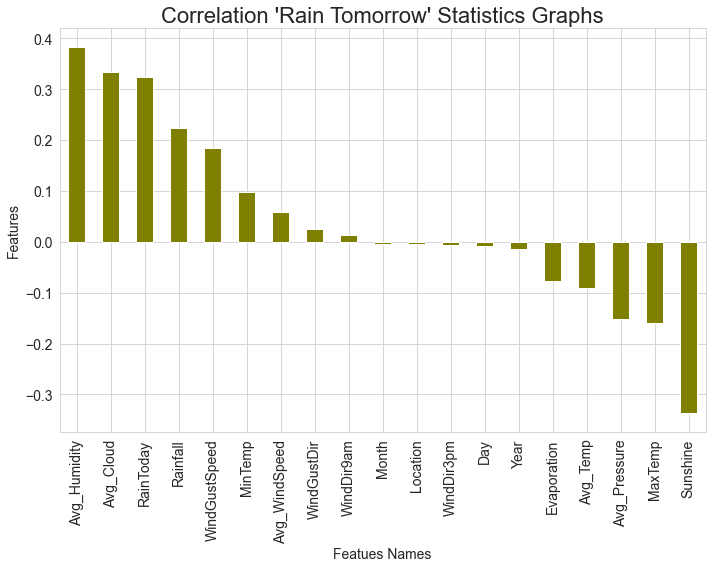

In [112]:
plt.figure(figsize=(10,8))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='olive')
plt.title("Correlation 'Rain Tomorrow' Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

## Observation:

- Sunshine is 34 percentage Negatively Correlated with the Target Variable which is very Week Bond. 
- Temp3pm is 20 percentage Negatively Correlated with the Target Variable Which  is a week Bond.    
- MaxTemp  is 16 percentage Negatively Correlated with the Target Variable which is a week Bond. 
- Pressure9am  is 16 percentage Negatively Correlated with the Target Variable which is a week Bond. 
- Pressure3pm  is 13 percentage Negatively Correlated with the Target Variable which is a week Bond
- Evaporation is 8 percentage Negatively Correlated with the Target Variable which is a week Bond.
- WindDir3pm is 1 percentage Negatively Correlated with the Target Variable which is a week Bond close to zero.
- Location  is 1 percentage Negatively Correlated with the Target Variable which is a week Bond close to Zero. 
- WindDir9am is 1 percentage Positively Correlated with the Target Variable which is week Bond close to Zero.    
- WindGustDir is 3 percentage Positively Correlated with the Target Variable which is a good Bond but close to zero.
- MinTemp is 10 percentage Positively Correlated with the Target Variable which is a good Bond.
- WindGustSpeed is 18  percentage Positively Correlated with the Target Variable which is a very good Bond.
- Rainfall is 22 percentage Positively Correlated with the Target Variable which is very good Bond.
- RainToday is 32 Positively Correlated with the Target Variable which is strong Bond-

# Checking Outliers

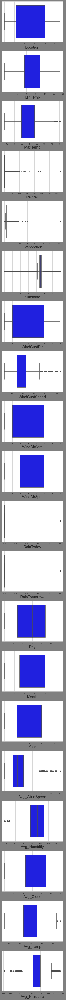

In [113]:
plt.figure(figsize=(5,80),facecolor='grey',edgecolor='black',)

plotnumber=1

for column in df:
    if plotnumber<=22 : 
        sns.set_style('whitegrid')
        ax=plt.subplot(22,1,plotnumber)
        sns.boxplot(df[column],color='blue')
        plt.xlabel(column , fontsize=20)
        
    plotnumber+=1
plt.tight_layout()

# Observation


- Maximum Outliers: Evaporation,Sunshine

- Target Variable:Rainfall,Rain Tomorrow

# Skewness:

In [116]:
df.skew().sort_values()

Sunshine         -1.378286
Avg_Cloud        -0.471031
WindDir3pm       -0.335250
Avg_Humidity     -0.226418
MinTemp          -0.084215
WindGustDir      -0.005012
Location         -0.000009
Day               0.006240
Month             0.021988
Avg_Pressure      0.051579
Avg_Temp          0.061349
WindDir9am        0.118686
MaxTemp           0.330020
Year              0.354481
Avg_WindSpeed     0.652130
WindGustSpeed     0.838665
RainToday         1.266937
RainTomorrow      1.266937
Evaporation      13.603792
Rainfall         13.637400
dtype: float64

Skewness Threshold is taken is(+/-65).
--------------------------------------------

Outcome shows, Column showing skewness are..

- Sunshine         -01.378286
- WindGustSpeed     00.838665
- RainToday         01.266937
- RainTomorrow      01.266937
- Evaporation       13.603792
- Rainfall          13.637400

<AxesSubplot:xlabel='Sunshine', ylabel='Density'>

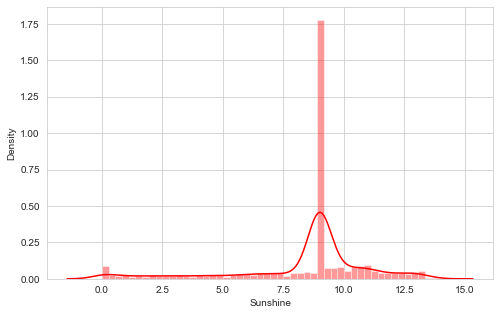

In [117]:
plt.figure(figsize=(8,5))
sns.distplot(df['Sunshine'],color='r',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bi-modal)

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Density'>

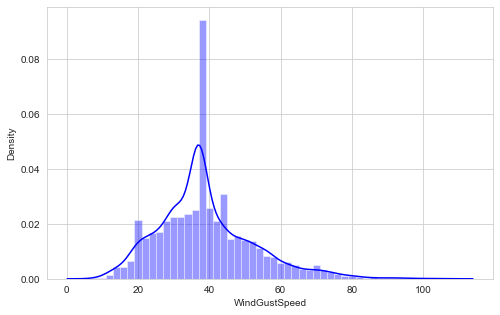

In [118]:
plt.figure(figsize=(8,5))
sns.distplot(df['WindGustSpeed'],color='blue',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

<AxesSubplot:xlabel='RainToday', ylabel='Density'>

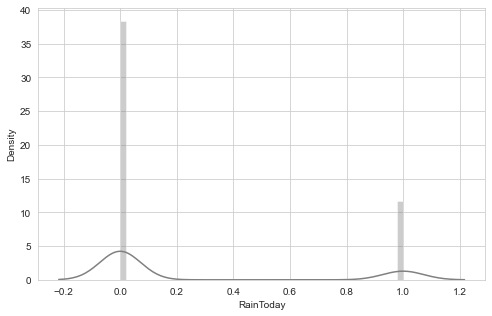

In [119]:
plt.figure(figsize=(8,5))
sns.distplot(df['RainToday'],color='grey',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.(Bimodal)

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

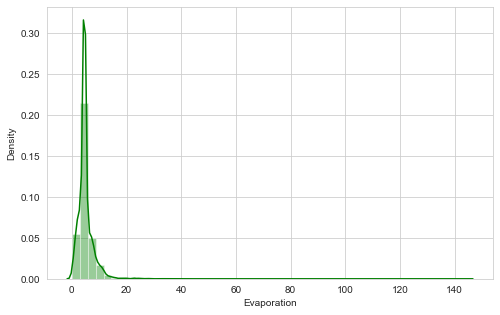

In [120]:
plt.figure(figsize=(8,5))
sns.distplot(df['Evaporation'],color='green',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

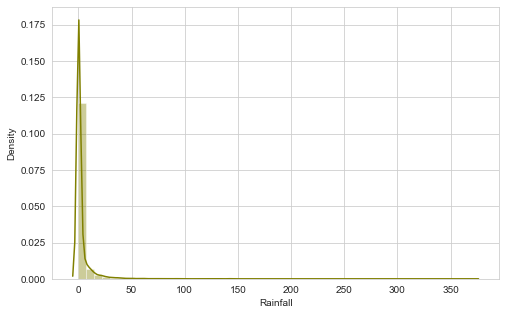

In [121]:
plt.figure(figsize=(8,5))
sns.distplot(df['Rainfall'],color='olive',kde=True)

The data in the given graph shows is not normalised.The Building blocks are beyond the normal curve.

## Making a Copy of Data Frame: For Linear Regression and Logistic Regression 

In [122]:
# Regression Model:
df2=df.copy()

In [123]:
df2.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow', 'Day', 'Month', 'Year', 'Avg_WindSpeed', 'Avg_Humidity',
       'Avg_Cloud', 'Avg_Temp', 'Avg_Pressure'],
      dtype='object')

In [124]:
#Logistic Model
df3=df.copy()

In [125]:
# for linear
df2.head(4)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,13.4,22.9,0.6,4.6,9.0,7,44.0,7,3,0,0,0,11,0,22.0,82.0,10.5,27.80,1511.25
1,1,7.4,25.1,0.0,4.6,9.0,3,44.0,3,6,0,0,1,11,0,13.0,56.5,7.5,29.35,1514.50
2,1,12.9,25.7,0.0,4.6,9.0,6,46.0,7,6,0,0,2,11,0,22.5,53.0,6.0,32.60,1511.95
3,1,9.2,28.0,0.0,4.6,9.0,2,24.0,5,0,0,0,3,11,0,10.0,53.0,7.5,31.35,1524.00


In [126]:
df3.head(4)# Logistic Model

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Day,Month,Year,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,13.4,22.9,0.6,4.6,9.0,7,44.0,7,3,0,0,0,11,0,22.0,82.0,10.5,27.80,1511.25
1,1,7.4,25.1,0.0,4.6,9.0,3,44.0,3,6,0,0,1,11,0,13.0,56.5,7.5,29.35,1514.50
2,1,12.9,25.7,0.0,4.6,9.0,6,46.0,7,6,0,0,2,11,0,22.5,53.0,6.0,32.60,1511.95
3,1,9.2,28.0,0.0,4.6,9.0,2,24.0,5,0,0,0,3,11,0,10.0,53.0,7.5,31.35,1524.00


# DATA CLEANSING: LOGISTIC

In [127]:
print(round(df3.corr()['RainTomorrow'].sort_values(),2))

Sunshine        -0.34
MaxTemp         -0.16
Avg_Pressure    -0.15
Avg_Temp        -0.09
Evaporation     -0.08
Year            -0.01
Day             -0.01
WindDir3pm      -0.01
Location        -0.00
Month           -0.00
WindDir9am       0.01
WindGustDir      0.02
Avg_WindSpeed    0.06
MinTemp          0.10
WindGustSpeed    0.18
Rainfall         0.22
RainToday        0.32
Avg_Cloud        0.33
Avg_Humidity     0.38
RainTomorrow     1.00
Name: RainTomorrow, dtype: float64


#### Creating a data frame delete and droping the columns due to Various reasons:

- Sunshine : Very Negatively Correlated towards target Variable:
- Location,Month is close to zero hence droping the columns:
    


In [128]:
delete=pd.DataFrame({"Columns":['Sunshine','WindDir3pm','Location','WindDir9am','Month','Day','Year'],
                   "Values":[-0.34,-0.01,-0.00,0.01,-0.0,0.01,0.01],
                   "Outliers":['yes','No','No','No','NO','No','No'],
                   "Normalised":['No','yes','yes','yes','NO','No','No']})
delete

,Columns,Values,Outliers,Normalised
0,Sunshine,-0.34,yes,No
1,WindDir3pm,-0.01,No,yes
2,Location,-0.00,No,yes
3,WindDir9am,0.01,No,yes
4,Month,-0.00,NO,NO
5,Day,0.01,No,No
6,Year,0.01,No,No


In [129]:
df3.drop(['Sunshine','WindDir3pm','Location','WindDir9am','Month','Day','Year'],axis=1,inplace=True)

# Removing Outliers: By Zscore

In [130]:
from scipy.stats import zscore

z=np.abs(zscore(df3))
z.head(4)

,MinTemp,MaxTemp,Rainfall,Evaporation,WindGustDir,WindGustSpeed,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,0.052329,0.194668,0.202435,0.11869,1.601995,0.395568,0.550355,0.550355,0.802729,0.444470,1.117632,0.172614,1.558593
1,1.030652,0.164227,0.259635,0.11869,0.092466,0.395568,0.550355,0.550355,0.254135,1.499703,0.217331,0.012419,1.194939
2,0.037920,0.262108,0.259635,0.11869,1.178380,0.544900,0.550355,0.550355,0.861444,1.644538,0.232820,0.400391,1.480267
3,0.705758,0.637317,0.259635,0.11869,0.516081,1.097751,0.550355,0.550355,0.606423,1.644538,0.217331,0.251171,0.131951


In [131]:
np.where(z>3)

(array([   8,   12,   44,   52,   60,   61,   62,   62,   68,  123,  267,
         381,  431,  462,  466,  563,  568,  569,  602,  683,  699,  713,
         748,  770,  795,  796,  797,  802,  928,  935,  949,  979,  980,
         980,  980, 1008, 1009, 1011, 1138, 1148, 1149, 1151, 1202, 1203,
        1237, 1241, 1264, 1265, 1357, 1411, 1412, 1413, 1479, 1480, 1481,
        1513, 1661, 1673, 1680, 1774, 1819, 1873, 1898, 1903, 2108, 2116,
        2201, 2219, 2231, 2265, 2281, 2429, 2488, 2500, 2505, 2527, 2541,
        2593, 2676, 2677, 2735, 2827, 2835, 2849, 2849, 2855, 2863, 2869,
        2877, 2883, 2890, 2891, 2897, 2898, 2900, 2900, 2901, 2905, 2909,
        2911, 2919, 2925, 2933, 2939, 2947, 2953, 2961, 2967, 2975, 2989,
        3003, 3042, 3045, 3051, 3052, 3055, 3058, 3059, 3060, 3066, 3067,
        3067, 3068, 3070, 3082, 3082, 3089, 3089, 3099, 3099, 3101, 3101,
        3143, 3150, 3153, 3157, 3157, 3164, 3169, 3172, 3178, 3185, 3192,
        3206, 3212, 3213, 3221, 3227, 

In [132]:
df.iloc[8,5]

9.0

In [133]:
new_df3=df3[(z<3).all(axis=1)]

# Data Loss Percentage

In [134]:
print("Old DataFrame",df3.shape[0])
print("New DataFrame",new_df3.shape[0])
print("Total_Dropped_rows",df3.shape[0]-new_df3.shape[0])

Old DataFrame 6762
New DataFrame 6467
Total_Dropped_rows 295


In [135]:
print('Data Loss Percentage ',((df3.shape[0]-new_df3.shape[0])/df3.shape[0])*100)

Data Loss Percentage  4.362614611061816


#### However Data Loss is less than 8 percent we will procced with the new_df3

# New Data Frame:

In [136]:
new_df3.head(4)

,MinTemp,MaxTemp,Rainfall,Evaporation,WindGustDir,WindGustSpeed,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,13.4,22.9,0.6,4.6,7,44.0,0,0,22.0,82.0,10.5,27.80,1511.25
1,7.4,25.1,0.0,4.6,3,44.0,0,0,13.0,56.5,7.5,29.35,1514.50
2,12.9,25.7,0.0,4.6,6,46.0,0,0,22.5,53.0,6.0,32.60,1511.95
3,9.2,28.0,0.0,4.6,2,24.0,0,0,10.0,53.0,7.5,31.35,1524.00


In [137]:
# Dividing the train and test data set
x=new_df3.drop(['RainTomorrow'],axis=1)
y=new_df3.iloc[:,7]

In [138]:
x.head(2)

,MinTemp,MaxTemp,Rainfall,Evaporation,WindGustDir,WindGustSpeed,RainToday,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,13.4,22.9,0.6,4.6,7,44.0,0,22.0,82.0,10.5,27.80,1511.25
1,7.4,25.1,0.0,4.6,3,44.0,0,13.0,56.5,7.5,29.35,1514.50


In [139]:
y.head(2)

0    0
1    0
Name: RainTomorrow, dtype: int32

In [140]:
print("Present Size of X Data ",x.shape,"And present Size of Y Data ",y.shape)

Present Size of X Data  (6467, 12) And present Size of Y Data  (6467,)


In [141]:
x.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'WindGustDir',
       'WindGustSpeed', 'RainToday', 'Avg_WindSpeed', 'Avg_Humidity',
       'Avg_Cloud', 'Avg_Temp', 'Avg_Pressure'],
      dtype='object')

# Removing Skewness

In [142]:
from sklearn.preprocessing import power_transform

x=power_transform(x,method='yeo-johnson')

In [143]:
x=pd.DataFrame(data=x,columns=['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'WindGustDir',
       'WindGustSpeed', 'RainToday', 'Avg_WindSpeed', 'Avg_Humidity',
       'Avg_Cloud', 'Avg_Temp', 'Avg_Pressure'])

In [144]:
x.skew()

MinTemp         -0.113244
MaxTemp         -0.016401
Rainfall         1.068948
Evaporation      0.059781
WindGustDir     -0.228375
WindGustSpeed    0.006899
RainToday        1.338890
Avg_WindSpeed   -0.068057
Avg_Humidity    -0.064105
Avg_Cloud       -0.312161
Avg_Temp        -0.047519
Avg_Pressure     0.000000
dtype: float64

In [145]:
x.drop(['Rainfall','RainToday'],inplace=True,axis=1)
x.skew()

MinTemp         -0.113244
MaxTemp         -0.016401
Evaporation      0.059781
WindGustDir     -0.228375
WindGustSpeed    0.006899
Avg_WindSpeed   -0.068057
Avg_Humidity    -0.064105
Avg_Cloud       -0.312161
Avg_Temp        -0.047519
Avg_Pressure     0.000000
dtype: float64

# Standard Scaler

In [146]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()

x=ss.fit_transform(x)

In [147]:
x

array([[ 0.0739731 , -0.13046808,  0.01618232, ...,  1.17320659,
        -0.14859079, -1.67197611],
       [-1.01254485,  0.23127469,  0.01618232, ...,  0.19849034,
         0.03713066, -1.27817288],
       [-0.01587509,  0.32715012,  0.01618232, ..., -0.26707203,
         0.4227912 , -1.586573  ],
       ...,
       [-1.37992772,  0.51559291,  0.01618232, ...,  0.19849034,
        -0.42043532,  0.48208011],
       [-0.93944768,  0.53110433,  0.01618232, ..., -0.85948303,
        -0.11254933,  0.28280618],
       [ 0.34290038, -0.03015019,  0.01618232, ...,  1.67901281,
        -0.43258241,  0.4536124 ]])

In [150]:
print(" Mean Value ",round(x.mean(),2)," Standard Deviation ",round(x.std(),2))

 Mean Value  0.0  Standard Deviation  1.0


# Target Variable:

0    5023
1    1444
Name: RainTomorrow, dtype: int64

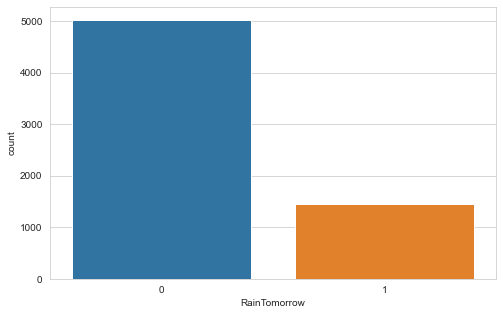

In [152]:
plt.figure(figsize=(8,5))
sns.countplot(x=y)
y.value_counts()

### Imbalanced DataSet

In [153]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()

In [154]:
x,y=smt.fit_resample(x,y)

0    5023
1    5023
Name: RainTomorrow, dtype: int64

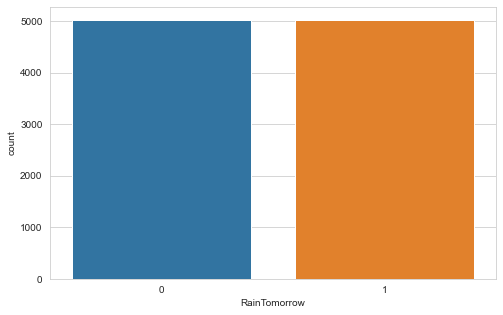

In [155]:
plt.figure(figsize=(8,5))
sns.countplot(x=y)
y.value_counts()

# Importing Library

In [156]:
# linear_model,train test and metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

# Clssifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier

# cross Validation
from sklearn.model_selection import cross_val_score

# Ensamble
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

# neural network
from sklearn.neural_network import MLPClassifier

# hyper paramter
from sklearn.model_selection import GridSearchCV

## Instances 

In [157]:
lg=LogisticRegression()
dtc=DecisionTreeClassifier()
knc=KNeighborsClassifier()
gnb=GaussianNB()
svc=SVC()
sgd=SGDClassifier()
etc=ExtraTreesClassifier()
rfc=RandomForestClassifier()
ada=AdaBoostClassifier()
gbc=GradientBoostingClassifier()
mlp=MLPClassifier()

### Finding Train Test

In [158]:
for i in range(0,1000):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    #train and score
    lg.fit(x_train,y_train)
    lg.score(x_train,y_train)
    
    #predict train and test
    pred_train=lg.predict(x_train)
    pred_test=lg.predict(x_test)
    
    # loop
    if round(accuracy_score(y_train,pred_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("The random state:-",i)
        print("Training accuracy_score is ",accuracy_score(y_train,pred_train)*100)
        print("Testing accuracy_score is ",accuracy_score(y_test,pred_test)*100,"\n")

The random state:- 17
Training accuracy_score is  75.01244400199104
Testing accuracy_score is  74.97512437810944 

The random state:- 25
Training accuracy_score is  75.08710801393728
Testing accuracy_score is  75.12437810945273 

The random state:- 110
Training accuracy_score is  75.11199601791935
Testing accuracy_score is  75.07462686567165 

The random state:- 112
Training accuracy_score is  75.03733200597313
Testing accuracy_score is  75.02487562189056 

The random state:- 114
Training accuracy_score is  75.13688402190144
Testing accuracy_score is  75.12437810945273 

The random state:- 138
Training accuracy_score is  75.14932802389248
Testing accuracy_score is  75.07462686567165 

The random state:- 150
Training accuracy_score is  75.08710801393728
Testing accuracy_score is  75.07462686567165 

The random state:- 165
Training accuracy_score is  75.1244400199104
Testing accuracy_score is  75.07462686567165 

The random state:- 166
Training accuracy_score is  75.06222000995521
Testin

In [159]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=484,test_size=0.20)

#sent for training
lg.fit(x_train,y_train)

#predict(x_training data)
pred_train=lg.predict(x_train) 
pred_test=lg.predict(x_test) 

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_test,pred_test),'\n',"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test),"\n")
print("Classification Report \n",classification_report(y_test,pred_test),'\n\n')

Accuracy Training Score = 0.7507466401194625  Accuracy Test Score = 0.7507462686567165 

Training Confusion_Matrix 
 [[765 260]
 [241 744]] 
 Testing Confusion_Matrix 
 [[765 260]
 [241 744]] 

Classification Report 
               precision    recall  f1-score   support

           0       0.76      0.75      0.75      1025
           1       0.74      0.76      0.75       985

    accuracy                           0.75      2010
   macro avg       0.75      0.75      0.75      2010
weighted avg       0.75      0.75      0.75      2010
 




## Model Cross Validation:

In [160]:
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

for i in range(2,10):
    cv_score=cross_val_score(lg,x,y,cv=i)
    cv_mean=cv_score.mean()
    
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.7071471232331276 Training Score  0.7507466401194625 Testing Score  0.7507462686567165
A cross-fold  3 CV_mean  0.7234785338062837 Training Score  0.7507466401194625 Testing Score  0.7507462686567165
A cross-fold  4 CV_mean  0.7240725996697334 Training Score  0.7507466401194625 Testing Score  0.7507462686567165
A cross-fold  5 CV_mean  0.7222758779522003 Training Score  0.7507466401194625 Testing Score  0.7507462686567165
A cross-fold  6 CV_mean  0.7162150418754495 Training Score  0.7507466401194625 Testing Score  0.7507462686567165
A cross-fold  7 CV_mean  0.7324310103143098 Training Score  0.7507466401194625 Testing Score  0.7507462686567165
A cross-fold  8 CV_mean  0.7238852710178394 Training Score  0.7507466401194625 Testing Score  0.7507462686567165
A cross-fold  9 CV_mean  0.7225758141349057 Training Score  0.7507466401194625 Testing Score  0.7507462686567165


### Selected CrossFold 7 as cv_score is close to Testing Score

In [161]:
# accuracy score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#score and mean
cv_score =cross_val_score(lg,x,y,cv=7)
cv_mean  =cv_score.mean()

# result
print("A cross-fold ",i,"cv_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  9 cv_mean  0.7324310103143098 Training Score  0.7507466401194625 Testing Score  0.7507462686567165


### Auc_Roc_Graph 

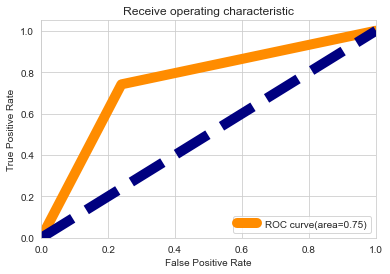

In [162]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model 1. Decision Tree

In [163]:
#train and score
dtc.fit(x_train,y_train)
dtc_score=dtc.score(x_train,y_train)

#predict
pred_train=dtc.predict(x_train)
pred_test=dtc.predict(x_test)

#result
print("Training Score",dtc_score)
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Training Score 0.9996266799402688
Accuracy Training Score = 0.9996266799402688  Accuracy Test Score = 0.8079601990049752 

Training Confusion_Matrix 
 [[3998    0]
 [   3 4035]] Testing Confusion_Matrix 
 [[796 229]
 [157 828]]
Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.78      0.80      1025
           1       0.78      0.84      0.81       985

    accuracy                           0.81      2010
   macro avg       0.81      0.81      0.81      2010
weighted avg       0.81      0.81      0.81      2010



## Model Cross Validation:

In [164]:
#train test Accuracy
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#Range finding cv Score
for i in range(2,10):
    cv_score=cross_val_score(dtc,x,y,cv=i)
    cv_mean=cv_score.mean()
    
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.6681266175592275 Training Score  0.9996266799402688 Testing Score  0.8079601990049752
A cross-fold  3 CV_mean  0.7136214867779738 Training Score  0.9996266799402688 Testing Score  0.8079601990049752
A cross-fold  4 CV_mean  0.7192004463798777 Training Score  0.9996266799402688 Testing Score  0.8079601990049752
A cross-fold  5 CV_mean  0.7308388371730199 Training Score  0.9996266799402688 Testing Score  0.8079601990049752
A cross-fold  6 CV_mean  0.7425031354577173 Training Score  0.9996266799402688 Testing Score  0.8079601990049752
A cross-fold  7 CV_mean  0.7545346081907184 Training Score  0.9996266799402688 Testing Score  0.8079601990049752
A cross-fold  8 CV_mean  0.7576326065166088 Training Score  0.9996266799402688 Testing Score  0.8079601990049752
A cross-fold  9 CV_mean  0.750759326822322 Training Score  0.9996266799402688 Testing Score  0.8079601990049752


### Selected CrossFold 8 as cv_score is close to Testing Score

In [165]:
# accuracy score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#score and mean
cv_score =cross_val_score(dtc,x,y,cv=8)
cv_mean  =cv_score.mean()

# result
print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  9 CV_mean  0.7503660517167001 Training Score  0.9996266799402688 Testing Score  0.8079601990049752


## Graph

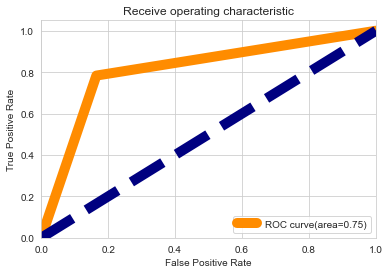

In [166]:
from sklearn.metrics import roc_curve

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_curve=auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# KNeighbors Classifier

In [167]:
# train and score
knc.fit(x_train,y_train)
knc_score=knc.score(x_train,y_train)

#predict
pred_train= knc.predict(x_train)
pred_test = knc.predict(x_test)

#result
print("Training Score",knc_score)
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Training Score 0.8887506222000996
Accuracy Training Score = 0.8887506222000996  Accuracy Test Score = 0.8228855721393035 

Training Confusion_Matrix 
 [[3213  785]
 [ 109 3929]] Testing Confusion_Matrix 
 [[724 301]
 [ 55 930]]
Classification Report 
               precision    recall  f1-score   support

           0       0.93      0.71      0.80      1025
           1       0.76      0.94      0.84       985

    accuracy                           0.82      2010
   macro avg       0.84      0.83      0.82      2010
weighted avg       0.84      0.82      0.82      2010



## Model Cross Validation:

In [168]:
#accuracy
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#range for cv 
for i in range(2,10):
    cv_score=cross_val_score(knc,x,y,cv=i)
    cv_mean=cv_score.mean()
    
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.6732032649810871 Training Score  0.8887506222000996 Testing Score  0.8228855721393035
A cross-fold  3 CV_mean  0.7233762665531738 Training Score  0.8887506222000996 Testing Score  0.8228855721393035
A cross-fold  4 CV_mean  0.7323343768311151 Training Score  0.8887506222000996 Testing Score  0.8228855721393035
A cross-fold  5 CV_mean  0.7474612502445463 Training Score  0.8887506222000996 Testing Score  0.8228855721393035
A cross-fold  6 CV_mean  0.7548418005551691 Training Score  0.8887506222000996 Testing Score  0.8228855721393035
A cross-fold  7 CV_mean  0.7724496035250842 Training Score  0.8887506222000996 Testing Score  0.8228855721393035
A cross-fold  8 CV_mean  0.7720654008171137 Training Score  0.8887506222000996 Testing Score  0.8228855721393035
A cross-fold  9 CV_mean  0.7665708661655947 Training Score  0.8887506222000996 Testing Score  0.8228855721393035


### Selected CrossFold 8 as cv score is close to Testing Score

In [169]:
#accuracy
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#cross val score(K_neighbors)
knc_cv_score=cross_val_score(knc,x,y,cv=8) # cv_score is near to training score
knc_mean=knc_cv_score.mean()

#predict result
print(" Cross Validation_mean ",knc_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

 Cross Validation_mean  0.7720654008171137 Training Score  0.8887506222000996 Testing Score  0.8228855721393035


### Graph

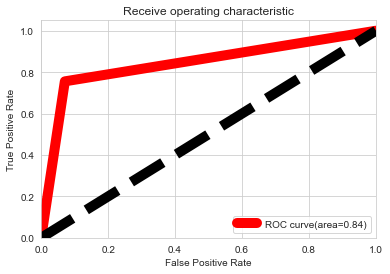

In [170]:
## AOC ROC score curve 
from sklearn.metrics import roc_curve

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='red',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model 3: SVC (Support Vector Machine)

In [171]:
#train and score
svc.fit(x_train,y_train)
svc_score=svc.score(x_train,y_train)

# predict
pred_train=svc.predict(x_train)
pred_test=svc.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.8017670482827277  Accuracy Test Score = 0.7860696517412935 

Training Confusion_Matrix 
 [[3169  829]
 [ 764 3274]] Testing Confusion_Matrix 
 [[788 237]
 [193 792]]
Classification Report 
               precision    recall  f1-score   support

           0       0.80      0.77      0.79      1025
           1       0.77      0.80      0.79       985

    accuracy                           0.79      2010
   macro avg       0.79      0.79      0.79      2010
weighted avg       0.79      0.79      0.79      2010



## Model Cross Validation

In [172]:
#score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val 
for i in range(2,10):
    cv_svc_score=cross_val_score(svc,x,y,cv=i)
    cv_mean=cv_svc_score.mean() 
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.6475214015528569 Training Score  0.8017670482827277 Testing Score  0.7860696517412935
A cross-fold  3 CV_mean  0.7005818471582606 Training Score  0.8017670482827277 Testing Score  0.7860696517412935
A cross-fold  4 CV_mean  0.6989864421386662 Training Score  0.8017670482827277 Testing Score  0.7860696517412935
A cross-fold  5 CV_mean  0.7102298363830425 Training Score  0.8017670482827277 Testing Score  0.7860696517412935
A cross-fold  6 CV_mean  0.7138307268912308 Training Score  0.8017670482827277 Testing Score  0.7860696517412935
A cross-fold  7 CV_mean  0.7297445617284893 Training Score  0.8017670482827277 Testing Score  0.7860696517412935
A cross-fold  8 CV_mean  0.7212018169360774 Training Score  0.8017670482827277 Testing Score  0.7860696517412935
A cross-fold  9 CV_mean  0.7217770012482231 Training Score  0.8017670482827277 Testing Score  0.7860696517412935


### Selected CrossFold 7 as cv_score is close to Testing Score

In [173]:
#accuracy score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#cross val score
svc_cv_score=cross_val_score(svc,x,y,cv=7)
svc_mean=svc_cv_score.mean()

print(" CV_mean ",svc_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

 CV_mean  0.7297445617284893 Training Score  0.8017670482827277 Testing Score  0.7860696517412935


### ModelGraph

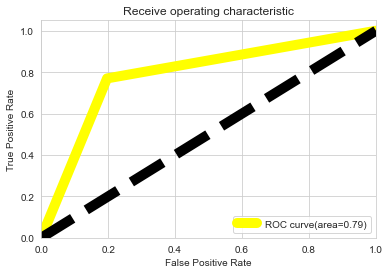

In [174]:
## AOC ROC score curve 
from sklearn.metrics import roc_curve

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='yellow',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model 4. Naive_bayes

In [175]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()

#train and score
gnb.fit(x_train,y_train)
gnb_score=gnb.score(x_train,y_train)

# predict
pred_train=gnb.predict(x_train)
pred_test=gnb.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.7289696366351419  Accuracy Test Score = 0.735820895522388 

Training Confusion_Matrix 
 [[2800 1198]
 [ 980 3058]] Testing Confusion_Matrix 
 [[723 302]
 [229 756]]
Classification Report 
               precision    recall  f1-score   support

           0       0.76      0.71      0.73      1025
           1       0.71      0.77      0.74       985

    accuracy                           0.74      2010
   macro avg       0.74      0.74      0.74      2010
weighted avg       0.74      0.74      0.74      2010



## Model Cross Validation

In [176]:
#score
gnb_train=accuracy_score(y_train,pred_train)
gnb_test=accuracy_score(y_test,pred_test)

#cross val 
for i in range(2,10):
    cv_gnb_score=cross_val_score(gnb,x,y,cv=i)
    cv_mean=cv_gnb_score.mean()    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",gnb_train,"Testing Score ",gnb_test)

A cross-fold  2 CV_mean  0.633983675094565 Training Score  0.7289696366351419 Testing Score  0.735820895522388
A cross-fold  3 CV_mean  0.6996888816112659 Training Score  0.7289696366351419 Testing Score  0.735820895522388
A cross-fold  4 CV_mean  0.6985914840941894 Training Score  0.7289696366351419 Testing Score  0.735820895522388
A cross-fold  5 CV_mean  0.69719213786716 Training Score  0.7289696366351419 Testing Score  0.735820895522388
A cross-fold  6 CV_mean  0.7005851863739844 Training Score  0.7289696366351419 Testing Score  0.735820895522388
A cross-fold  7 CV_mean  0.7052604505352654 Training Score  0.7289696366351419 Testing Score  0.735820895522388
A cross-fold  8 CV_mean  0.7075643286725708 Training Score  0.7289696366351419 Testing Score  0.735820895522388
A cross-fold  9 CV_mean  0.7055546463956086 Training Score  0.7289696366351419 Testing Score  0.735820895522388


### Selected CrossFold 7 as cv_score is close to Testing Score

In [177]:
#score
gnb_train=accuracy_score(y_train,pred_train)
gnb_test=accuracy_score(y_test,pred_test)

#cross val score
cv_gnb_score=cross_val_score(gnb,x,y,cv=8)
gnb_mean=cv_gnb_score.mean()

print(" CV_mean ",gnb_mean,"Training Score ",gnb_train,"Testing Score ",gnb_test)

 CV_mean  0.7075643286725708 Training Score  0.7289696366351419 Testing Score  0.735820895522388


### ModelGraph

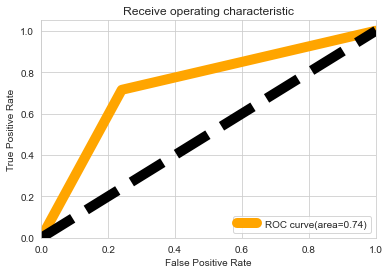

In [178]:
## AOC ROC score curve 
from sklearn.metrics import roc_curve

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='orange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

## Ensamble Technique


# Model1 Extra Trees Classifier

In [179]:
# train and score
etc.fit(x_train,y_train)
etc_score=etc.score(x_train,y_train)

#predict
pred_train=etc.predict(x_train)
pred_test=etc.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.9996266799402688  Accuracy Test Score = 0.9049751243781095 

Training Confusion_Matrix 
 [[3998    0]
 [   3 4035]] Testing Confusion_Matrix 
 [[893 132]
 [ 59 926]]
Classification Report 
               precision    recall  f1-score   support

           0       0.94      0.87      0.90      1025
           1       0.88      0.94      0.91       985

    accuracy                           0.90      2010
   macro avg       0.91      0.91      0.90      2010
weighted avg       0.91      0.90      0.90      2010



## Model Cross validation

In [180]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,30):
    cv_etc_score=cross_val_score(etc,x,y,cv=i)
    cv_mean=cv_etc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.7368106709137965 Training Score  0.9996266799402688 Testing Score  0.9049751243781095
A cross-fold  3 CV_Score  0.8122705304186214 Training Score  0.9996266799402688 Testing Score  0.9049751243781095
A cross-fold  4 CV_Score  0.8277958352674981 Training Score  0.9996266799402688 Testing Score  0.9049751243781095
A cross-fold  5 CV_Score  0.8201254553514161 Training Score  0.9996266799402688 Testing Score  0.9049751243781095
A cross-fold  6 CV_Score  0.8282046161070395 Training Score  0.9996266799402688 Testing Score  0.9049751243781095
A cross-fold  7 CV_Score  0.8558647645483901 Training Score  0.9996266799402688 Testing Score  0.9049751243781095
A cross-fold  8 CV_Score  0.8518962367092141 Training Score  0.9996266799402688 Testing Score  0.9049751243781095
A cross-fold  9 CV_Score  0.8425208402634496 Training Score  0.9996266799402688 Testing Score  0.9049751243781095
A cross-fold  10 CV_Score  0.8688204396344968 Training Score  0.9996266799402688 Testing

### Selected CrossFold 27 as cv_score is close to Testing Score

In [181]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
etc_cv_score=cross_val_score(etc,x,y,cv=27)
etc_mean=etc_cv_score.mean()

print(" CV_mean ",etc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.895375361812849 Testing Accuracy Score  0.9049751243781095


### Model Graph

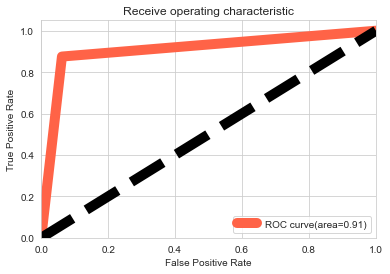

In [182]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='Tomato',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model2: Random Forest Classifier

In [183]:
#random Forest Training and score
rfc.fit(x_train,y_train)
rfc_score=rfc.score(x_train,y_train)

#predict random Forest
pred_train=rfc.predict(x_train)
pred_test=rfc.predict(x_test)
      
#result random Forest
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.9996266799402688  Accuracy Test Score = 0.8771144278606965 

Training Confusion_Matrix 
 [[3998    0]
 [   3 4035]] Testing Confusion_Matrix 
 [[870 155]
 [ 92 893]]
Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.85      0.88      1025
           1       0.85      0.91      0.88       985

    accuracy                           0.88      2010
   macro avg       0.88      0.88      0.88      2010
weighted avg       0.88      0.88      0.88      2010



## Model Cross Validation

In [184]:
#train and score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val for model
for i in range(2,30):
    cv_rfc_score=cross_val_score(rfc,x,y,cv=i)
    cv_mean=cv_rfc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.6918176388612383 Training Score  0.9996266799402688 Testing Score  0.8771144278606965
A cross-fold  3 CV_mean  0.7770326835438554 Training Score  0.9996266799402688 Testing Score  0.8771144278606965
A cross-fold  4 CV_mean  0.7781264030621952 Training Score  0.9996266799402688 Testing Score  0.8771144278606965
A cross-fold  5 CV_mean  0.785087355655768 Training Score  0.9996266799402688 Testing Score  0.8771144278606965
A cross-fold  6 CV_mean  0.7954580740265221 Training Score  0.9996266799402688 Testing Score  0.8771144278606965
A cross-fold  7 CV_mean  0.8178406086260851 Training Score  0.9996266799402688 Testing Score  0.8771144278606965
A cross-fold  8 CV_mean  0.8226328761387571 Training Score  0.9996266799402688 Testing Score  0.8771144278606965
A cross-fold  9 CV_mean  0.8098738870366984 Training Score  0.9996266799402688 Testing Score  0.8771144278606965
A cross-fold  10 CV_mean  0.8410538938772273 Training Score  0.9996266799402688 Testing Score  0.

### Selected Cross fold 27 as cv_score is close to Testing Score

In [185]:
#train and score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

# model cross val score
rfc_cv_score=cross_val_score(rfc,x,y,cv=27) 
rfc_mean=rfc_cv_score.mean()# mean value

print(" CV_mean ",rfc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.8643229842313125 Testing Accuracy Score  0.8771144278606965


### Model Graph

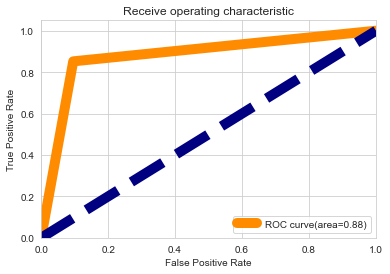

In [186]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

### Boosting Technique


# Model3: ADA BOOST Classifier

In [187]:
ada.fit(x_train,y_train)
ada_score=ada.score(x_train,y_train)

#predict
pred_train=ada.predict(x_train)
pred_test=ada.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.7840965654554505  Accuracy Test Score = 0.7980099502487562 

Training Confusion_Matrix 
 [[3095  903]
 [ 832 3206]] Testing Confusion_Matrix 
 [[797 228]
 [178 807]]
Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.78      0.80      1025
           1       0.78      0.82      0.80       985

    accuracy                           0.80      2010
   macro avg       0.80      0.80      0.80      2010
weighted avg       0.80      0.80      0.80      2010



## Model Cross Validation

In [188]:
#train and score for Ada Boost
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val for Ada Boost
for i in range(2,30):
    cv_ada_score=cross_val_score(ada,x,y,cv=i)
    cv_mean=cv_ada_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.6687238701970935 Training Score  0.7840965654554505 Testing Score  0.7980099502487562
A cross-fold  3 CV_mean  0.7074531957862562 Training Score  0.7840965654554505 Testing Score  0.7980099502487562
A cross-fold  4 CV_mean  0.7000857453320041 Training Score  0.7840965654554505 Testing Score  0.7980099502487562
A cross-fold  5 CV_mean  0.6945030447563081 Training Score  0.7840965654554505 Testing Score  0.7980099502487562
A cross-fold  6 CV_mean  0.7069623210114303 Training Score  0.7840965654554505 Testing Score  0.7980099502487562
A cross-fold  7 CV_mean  0.7230763791351176 Training Score  0.7840965654554505 Testing Score  0.7980099502487562
A cross-fold  8 CV_mean  0.7233908315781461 Training Score  0.7840965654554505 Testing Score  0.7980099502487562
A cross-fold  9 CV_mean  0.716703264811196 Training Score  0.7840965654554505 Testing Score  0.7980099502487562
A cross-fold  10 CV_mean  0.7386249033715881 Training Score  0.7840965654554505 Testing Score  0.

### Selected CrossFold 28 as cv_score is close to Testing Score

In [189]:
#Model_predict test
ada_test=ada.predict(x_test)

#cross val score
ada_cv_score=cross_val_score(ada,x,y,cv=28) 
ada_mean=ada_cv_score.mean()

print(" CV_mean ",ada_mean,"Testing Accuracy Score ",accuracy_score(y_test,ada_test))

 CV_mean  0.7572577902171279 Testing Accuracy Score  0.7980099502487562


### Model Graph

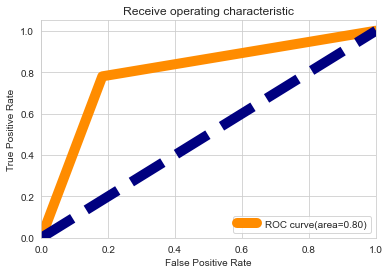

In [190]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Gradient Boosting Classfier

In [191]:
#train and score gradient Boosting Classifier
gbc.fit(x_train,y_train)
gbc_score=gbc.score(x_train,y_train)

#predict Gradient Boosting Classifier
pred_train=gbc.predict(x_train)
pred_test=gbc.predict(x_test)

#result gradient Boosting classifier
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.8325037332005973  Accuracy Test Score = 0.8283582089552238 

Training Confusion_Matrix 
 [[3327  671]
 [ 675 3363]] Testing Confusion_Matrix 
 [[840 185]
 [160 825]]
Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.82      0.83      1025
           1       0.82      0.84      0.83       985

    accuracy                           0.83      2010
   macro avg       0.83      0.83      0.83      2010
weighted avg       0.83      0.83      0.83      2010



## Model Cross Validation

In [192]:
#predict model 
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,20):
    cv_gbc_score=cross_val_score(gbc,x,y,cv=i)
    cv_mean=cv_gbc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.6559824805892893 Training Score  0.8325037332005973 Testing Score  0.8283582089552238
A cross-fold  3 CV_mean  0.7219865021495743 Training Score  0.8325037332005973 Testing Score  0.8283582089552238
A cross-fold  4 CV_mean  0.7164127916783984 Training Score  0.8325037332005973 Testing Score  0.8283582089552238
A cross-fold  5 CV_mean  0.7181962264337843 Training Score  0.8325037332005973 Testing Score  0.8283582089552238
A cross-fold  6 CV_mean  0.728567318722992 Training Score  0.8325037332005973 Testing Score  0.8283582089552238
A cross-fold  7 CV_mean  0.7411938061453266 Training Score  0.8325037332005973 Testing Score  0.8283582089552238
A cross-fold  8 CV_mean  0.746286985814703 Training Score  0.8325037332005973 Testing Score  0.8283582089552238
A cross-fold  9 CV_mean  0.736317944999032 Training Score  0.8325037332005973 Testing Score  0.8283582089552238
A cross-fold  10 CV_mean  0.7599354819527858 Training Score  0.8325037332005973 Testing Score  0.82

### Selected CrossFold 19 as cv_score is close to Testing Score

In [193]:
#predict model 
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
gbc_cv_score=cross_val_score(gbc,x,y,cv=19)
gbc_mean=gbc_cv_score.mean()

print(" CV_mean ",gbc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.7734849615446073 Testing Accuracy Score  0.8283582089552238


### Model Graph

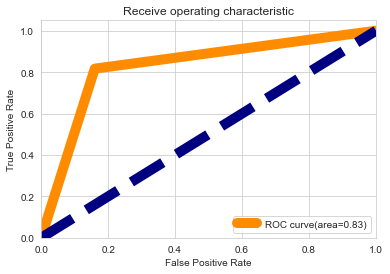

In [194]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model 5: MLP Classifier

In [195]:
#train
mlp.fit(x_train,y_train)
mlp_score=mlp.score(x_train,y_train)

#predict
pred_train=mlp.predict(x_train)
pred_test=mlp.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.8356147336983574  Accuracy Test Score = 0.7985074626865671 

Training Confusion_Matrix 
 [[3206  792]
 [ 529 3509]] Testing Confusion_Matrix 
 [[785 240]
 [165 820]]
Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.77      0.79      1025
           1       0.77      0.83      0.80       985

    accuracy                           0.80      2010
   macro avg       0.80      0.80      0.80      2010
weighted avg       0.80      0.80      0.80      2010



## Model Cross Validation

In [196]:
# accuracy_score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,10):
    cv_mlp_score=cross_val_score(mlp,x,y,cv=i)
    cv_mean=cv_mlp_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.6363726856460283 Training Score  0.8356147336983574 Testing Score  0.7985074626865671
A cross-fold  3 CV_mean  0.7187993313148632 Training Score  0.8356147336983574 Testing Score  0.7985074626865671
A cross-fold  4 CV_mean  0.7160092329419344 Training Score  0.8356147336983574 Testing Score  0.7985074626865671
A cross-fold  5 CV_mean  0.7207824491281769 Training Score  0.8356147336983574 Testing Score  0.7985074626865671
A cross-fold  6 CV_mean  0.7247803990798695 Training Score  0.8356147336983574 Testing Score  0.7985074626865671
A cross-fold  7 CV_mean  0.7417892464411541 Training Score  0.8356147336983574 Testing Score  0.7985074626865671
A cross-fold  8 CV_mean  0.7356344526353186 Training Score  0.8356147336983574 Testing Score  0.7985074626865671
A cross-fold  9 CV_mean  0.7306397063306411 Training Score  0.8356147336983574 Testing Score  0.7985074626865671


### Selected CrossFold 8 as cv_score is close to Testing Score

In [197]:
# accuracy_score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
mlp_cv_score=cross_val_score(mlp,x,y,cv=8)
cv_mean=mlp_cv_score.mean()

print(" CV_mean ",cv_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.728467182226508 Testing Accuracy Score  0.7985074626865671


### Model Graph

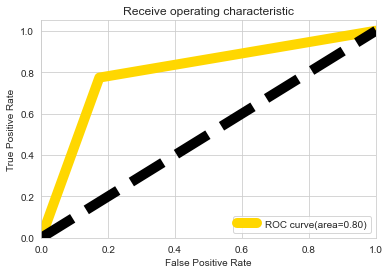

In [198]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='gold',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# SGD Classfier

In [199]:
from sklearn.linear_model import SGDClassifier
sgd=SGDClassifier()

#train and score
sgd.fit(x_train,y_train)
sgd_score=sgd.score(x_train,y_train)

#predict
pred_train=sgd.predict(x_train)
pred_test=sgd.predict(x_test)

#result
print("Train_Score",sgd_score)
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Train_Score 0.7391737182677949
Accuracy Training Score = 0.7391737182677949  Accuracy Test Score = 0.7497512437810945 

Training Confusion_Matrix 
 [[3127  871]
 [1225 2813]] Testing Confusion_Matrix 
 [[808 217]
 [286 699]]
Classification Report 
               precision    recall  f1-score   support

           0       0.74      0.79      0.76      1025
           1       0.76      0.71      0.74       985

    accuracy                           0.75      2010
   macro avg       0.75      0.75      0.75      2010
weighted avg       0.75      0.75      0.75      2010



## Model Cross Validation

In [200]:
# accuracy_score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,10):
    cv_sgd_score=cross_val_score(sgd,x,y,cv=i)
    cv_mean=cv_sgd_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.6570774437587099 Training Score  0.7391737182677949 Testing Score  0.7497512437810945
A cross-fold  3 CV_Score  0.7243754830195334 Training Score  0.7391737182677949 Testing Score  0.7497512437810945
A cross-fold  4 CV_Score  0.7179026931184318 Training Score  0.7391737182677949 Testing Score  0.7497512437810945
A cross-fold  5 CV_Score  0.6858390476685761 Training Score  0.7391737182677949 Testing Score  0.7497512437810945
A cross-fold  6 CV_Score  0.7152204925194815 Training Score  0.7391737182677949 Testing Score  0.7497512437810945
A cross-fold  7 CV_Score  0.7100306975157752 Training Score  0.7391737182677949 Testing Score  0.7497512437810945
A cross-fold  8 CV_Score  0.720301754764382 Training Score  0.7391737182677949 Testing Score  0.7497512437810945
A cross-fold  9 CV_Score  0.6882322971405671 Training Score  0.7391737182677949 Testing Score  0.7497512437810945


### Selected CrossFold 8 as cv_score is close to Testing Score

In [201]:
# accuracy_score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
sgd_cv_score=cross_val_score(sgd,x,y,cv=8)
cv_mean=sgd_cv_score.mean()

print(" CV_mean ",cv_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.7096516799045854 Testing Accuracy Score  0.7497512437810945


### Model Graph

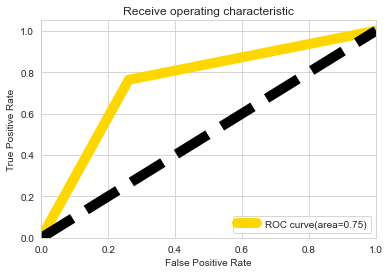

In [202]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='gold',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

## Almost all the models are working in range (80s to 90s). I Selected:

### Extra Tress  and Random Forest Classifier due to following result:

- Model CV_Score is far better.
- Model Testing score and Training accuracy is far better then other Models.
- Model Cv_score is close to testing score

# Model 2 Random Search with grid Search Cv

In [212]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rfc= RandomForestClassifier()

#Parameter  
parameters={'n_estimators':[100],
            'criterion':['gini', 'entropy', 'log_loss'],
           'max_features':['sqrt', 'log2','None'],
            'random_state':[504,484]}

gsv=GridSearchCV(rfc,parameters,cv=27)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 100, 'random_state': 484} Best Score  0.882031852203366


In [328]:
rfc=RandomForestClassifier( criterion='entropy', max_features= 'sqrt', n_estimators= 100,n_jobs= 10,random_state=504,
                           min_samples_split=2,min_samples_leaf=1,min_weight_fraction_leaf=0.000001,min_impurity_decrease=0.0000001,
                           ccp_alpha=0.000001,verbose=0,max_depth=168)

#random Forest Training and score
rfc.fit(x_train,y_train)
rfc.score(x_train,y_train)

#predict random Forest
pred_train1=rfc.predict(x_train)
pred_test1=rfc.predict(x_test)

      
#result random Forest
print("Train_Score",rfc.score(x_train,y_train))
print("Accuracy Training Score =",accuracy_score(y_train,pred_train1)," Accuracy Test Score =",accuracy_score(y_test,pred_test1),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train1),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test1))
print("Classification Report \n",classification_report(y_test,pred_test1))

Train_Score 0.9996266799402688
Accuracy Training Score = 0.9996266799402688  Accuracy Test Score = 0.881592039800995 

Training Confusion_Matrix 
 [[3998    0]
 [   3 4035]] Testing Confusion_Matrix 
 [[872 153]
 [ 85 900]]
Classification Report 
               precision    recall  f1-score   support

           0       0.91      0.85      0.88      1025
           1       0.85      0.91      0.88       985

    accuracy                           0.88      2010
   macro avg       0.88      0.88      0.88      2010
weighted avg       0.88      0.88      0.88      2010



## Model Cross Validation

In [329]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train1)
test_accuracy=accuracy_score(y_test,pred_test1)

#cross val
for i in range(2,20):
    cv_rfc_score=cross_val_score(rfc,x,y,cv=i)
    cv_mean=cv_rfc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.6940075652000797 Training Score  0.9996266799402688 Testing Score  0.881592039800995
A cross-fold  3 CV_Score  0.7820098880542217 Training Score  0.9996266799402688 Testing Score  0.881592039800995
A cross-fold  4 CV_Score  0.7755392197896136 Training Score  0.9996266799402688 Testing Score  0.881592039800995
A cross-fold  5 CV_Score  0.7869792897137012 Training Score  0.9996266799402688 Testing Score  0.881592039800995
A cross-fold  6 CV_Score  0.7964547037809755 Training Score  0.9996266799402688 Testing Score  0.881592039800995
A cross-fold  7 CV_Score  0.8194342034660185 Training Score  0.9996266799402688 Testing Score  0.881592039800995
A cross-fold  8 CV_Score  0.8245245134113228 Training Score  0.9996266799402688 Testing Score  0.881592039800995
A cross-fold  9 CV_Score  0.8083833995237428 Training Score  0.9996266799402688 Testing Score  0.881592039800995
A cross-fold  10 CV_Score  0.8371729004380489 Training Score  0.9996266799402688 Testing Score  

### Selected Crossfold 19 as cv_score is close to Testing Score

In [331]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train1)
test_accuracy=accuracy_score(y_test,pred_test1)

#cross val score
rfc_cv_score=cross_val_score(rfc,x,y,cv=19)
rfc_mean=rfc_cv_score.mean()

print(" CV_mean ",rfc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.8560945239882658 Testing Accuracy Score  0.881592039800995


### Model Graph

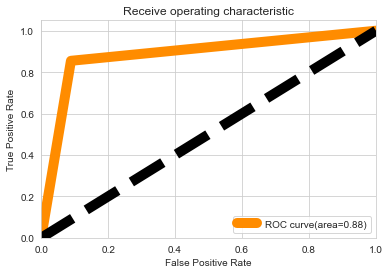

In [332]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test1,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model1: EXTRA TREES with Grid Search CV

In [383]:
# importing library Grid Search CV
from sklearn.model_selection import GridSearchCV

parameters={'n_estimators':[100,180],
             'criterion':['gini', 'entropy', 'log_loss'],
             'max_features':['sqrt','log2', 'None']}

gsv=GridSearchCV(etc,param_grid=parameters,cv=27,verbose=0)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'criterion': 'gini', 'max_features': 'log2', 'n_estimators': 180} Best Score  0.9014383624127598


In [403]:
etc=ExtraTreesClassifier(criterion='gini', max_features= 'log2', min_samples_split= 2 ,n_estimators= 180, n_jobs= 5,
                         min_impurity_decrease=0.000000001,random_state=180,class_weight='balanced',verbose=0,
                         ccp_alpha=0.00001,max_samples=None,min_weight_fraction_leaf=0.00001)

#train and score
etc.fit(x_train,y_train)
etc_score=etc.score(x_train,y_train)
#min_samples_leaf=1,min_weight_fraction_leaf=0.000001,,,verbose=0,max_depth=1441
#predict
pred_train1=etc.predict(x_train)
pred_test1=etc.predict(x_test)

#result
print("Training_Score",etc_score)
print("Training Accuracy_score ",accuracy_score(y_train,pred_train1)," Testing Accuracy_score ",accuracy_score(y_test,pred_test1))
print("Training Confusion_Matrics\n",confusion_matrix(y_train,pred_train1)," Testing Confusion Matrics\n ",confusion_matrix(y_test,pred_test1))
print("Classification Report \n",classification_report(y_test,pred_test1))

Training_Score 0.9996266799402688
Training Accuracy_score  0.9996266799402688  Testing Accuracy_score  0.9054726368159204
Training Confusion_Matrics
 [[3998    0]
 [   3 4035]]  Testing Confusion Matrics
  [[893 132]
 [ 58 927]]
Classification Report 
               precision    recall  f1-score   support

           0       0.94      0.87      0.90      1025
           1       0.88      0.94      0.91       985

    accuracy                           0.91      2010
   macro avg       0.91      0.91      0.91      2010
weighted avg       0.91      0.91      0.91      2010



## Model Cross Validation

In [404]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train1)
test_accuracy=accuracy_score(y_test,pred_test1)

#cross val
for i in range(2,20):
    cv_etc_score=cross_val_score(etc,x,y,cv=i)
    cv_mean=cv_etc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.735317539319132 Training Score  0.9996266799402688 Testing Score  0.9054726368159204
A cross-fold  3 CV_Score  0.8157545438470253 Training Score  0.9996266799402688 Testing Score  0.9054726368159204
A cross-fold  4 CV_Score  0.8208284027983878 Training Score  0.9996266799402688 Testing Score  0.9054726368159204
A cross-fold  5 CV_Score  0.820822170877816 Training Score  0.9996266799402688 Testing Score  0.9054726368159204
A cross-fold  6 CV_Score  0.8300955794504182 Training Score  0.9996266799402688 Testing Score  0.9054726368159204
A cross-fold  7 CV_Score  0.8533763801056804 Training Score  0.9996266799402688 Testing Score  0.9054726368159204
A cross-fold  8 CV_Score  0.8525922583551145 Training Score  0.9996266799402688 Testing Score  0.9054726368159204
A cross-fold  9 CV_Score  0.8408283766289562 Training Score  0.9996266799402688 Testing Score  0.9054726368159204
A cross-fold  10 CV_Score  0.8706118808348695 Training Score  0.9996266799402688 Testing S

### Selected CrossFold 19 as cv_score is close to Testing Score

In [405]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train1)
test_accuracy=accuracy_score(y_test,pred_test1)

#cross val score
etc_cv_score=cross_val_score(etc,x,y,cv=19)
etc_mean=etc_cv_score.mean()

print(" CV_mean ",etc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.8855479102034172 Testing Accuracy Score  0.9054726368159204


### Model Graph

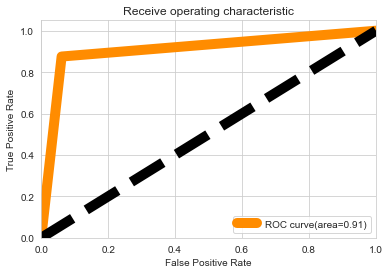

In [406]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test1,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

## However The Model are working at the best of 91 percentage

- Selecting Extra Trees as Traning score little better. and cv score is better

# Saving Model

In [407]:
import pickle
pickle.dump(etc,open('rain_pred.pkl','wb'))

In [408]:
# Loading Model Model

import pickle
loaded_model =pickle.load(open('rain_pred.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

90.54726368159204


In [409]:
model1=pd.DataFrame([loaded_model.predict(x_test)[:],pred_test1[:]],index=["Predicted","Original"])
model1

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

---------------------------